In [2]:
from astropy import units as u
from astropy import constants as const
import numpy as np
#Cálculo radio de Jacobi, o conocido también como aproximadamente el radio tidal
#fórmula que se usa en el paper Muñoz et al (2008)
def Radio_Jacobi(mc, e, a, mg):
    if e==0:
        return (a*((mc/mg)**(1/3))).to(u.pc)
    else:
        #los parametros son respectivamente: masa del cumulo, distancia actual,
        # elipticidad, distancia del apocentro y masa de la galaxia
        m = a*((mc/mg)**(1/3))
        log = (np.log((1+e)/(1-e)))
        hh = ((1-e)**2)
        x = ((((1+e)**2))/(2*e))*log
        return (m * ((hh/(x+1))**(1/3))).to(u.pc)

#Asumimos algunas cosas, como en Bajkiva & Bobylev (2022) los parámetros
#orbitales: 1)distancia galactocéntrica ,2) apocentro y 3) pericentro
#de la relación masa/luminosidad tenemos que M/L=3, pero L_cluster es:

L_5694 = 10**(5.107)*const.L_sun
L_5824 = 10**(5.648)*const.L_sun

#la masa del sol puede ser encontrada en J.L. Simon et al. (1994)
Masa_sol = 1.989 * (10**30)*u.kg

#asumimos por tanto que la masa del cluster es :
Masa_NGC5694 = 3 * L_5694 * Masa_sol/const.L_sun
Masa_NGC5824 = 3 * L_5824 * Masa_sol/const.L_sun

d_5694 = 29.1*u.kpc
d_5824 = 25.3*u.kpc

exc5694 = 0.92
exc5824 = 0.46

apo5694 = 71*u.kpc                
peri5694 = 28.1*u.kpc    

apo5824 = 36.4*u.kpc              
peri5824 = 13.54*u.kpc

#obteniendo la masa de la galaxia de "The Milky Way's Circular Velocity Curve to 60 kpc and an 
#Estimate of the Dark Matter Halo Mass" by X.X. Xue et al. (2008) [1.5*(10**12)*Masa_sol], 
#pero este valor no lo podemos considerar pues debemos ver la masa que está encerrada hasta
#la distancia a la cual está el cluster del centro de la vía láctea. Ahora bien, usando la fórmula 
#dada en "Do dwarf spheroidal galaxies contain dark matter?", A. Burkert, en donde se considera
#que el potencial gravitatorio en el que está el cluster es uno logarítmico. Esto también puede 
#verse en , que es de donde se toma Oh
#et al (1992):
G = 6.67*(10**(-11))* u.m**3 / (u.kg * u.s**2)
Masa_galaxia_5694 = 1.1*(10**10)*(d_5694/(1*u.kpc))*Masa_sol#((220000*u.m/u.s)**2)*d_5694/G #
Masa_galaxia_5824 = 1.1*(10**10)*(d_5824/(1*u.kpc))*Masa_sol#((220000*u.m/u.s)**2)*d_5824/G #

a5694 = (apo5694+peri5694)/2             #semieje mayor [m]
a5824 = (apo5824+peri5824)/2

RADIO_JAC5694 = Radio_Jacobi(Masa_NGC5694, exc5694, a5694, Masa_galaxia_5694)
RADIO_JAC5824 = Radio_Jacobi(Masa_NGC5824, exc5824, a5824, Masa_galaxia_5824)
#calculemos el radio angular:
angulo_radio5694 = (RADIO_JAC5694/d_5694)*u.rad  #en radianes
print("el radio de Jacobi de NGC 5694 es ",angulo_radio5694.to(u.arcmin), "o ", 
      RADIO_JAC5694)
angulo_radio5824 = (RADIO_JAC5824/d_5824)*u.rad  #en radianes
print("el radio de Jacobi de NGC 5824 es ",angulo_radio5824.to(u.arcmin), "o ", 
      RADIO_JAC5824)
RADIO_JAC5694 = RADIO_JAC5694.value
angulo_radio5694 = angulo_radio5694.value

el radio de Jacobi de NGC 5694 es  5.933755795327678 arcmin o  50.228334184314924 pc
el radio de Jacobi de NGC 5824 es  25.46841753570974 arcmin o  187.4340975691854 pc


In [3]:
Masa_galaxia_5694, Masa_galaxia_5824

(<Quantity 6.366789e+41 kg>, <Quantity 5.535387e+41 kg>)

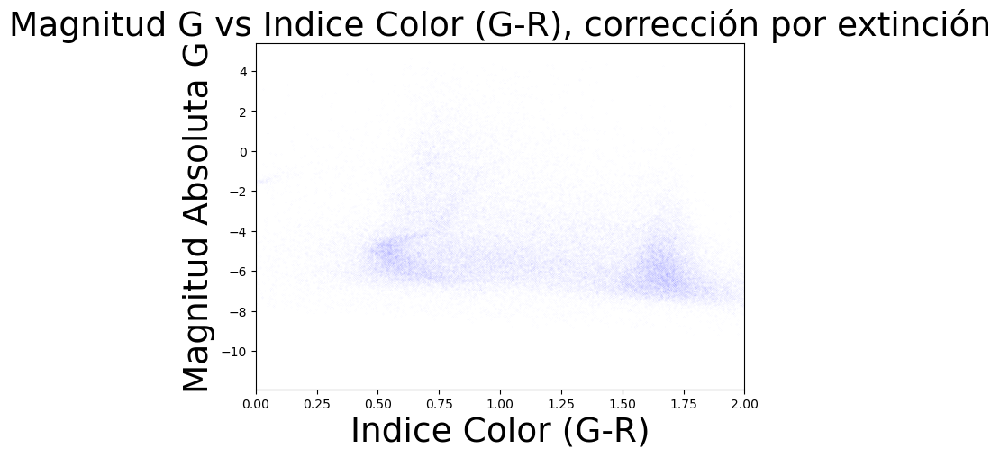

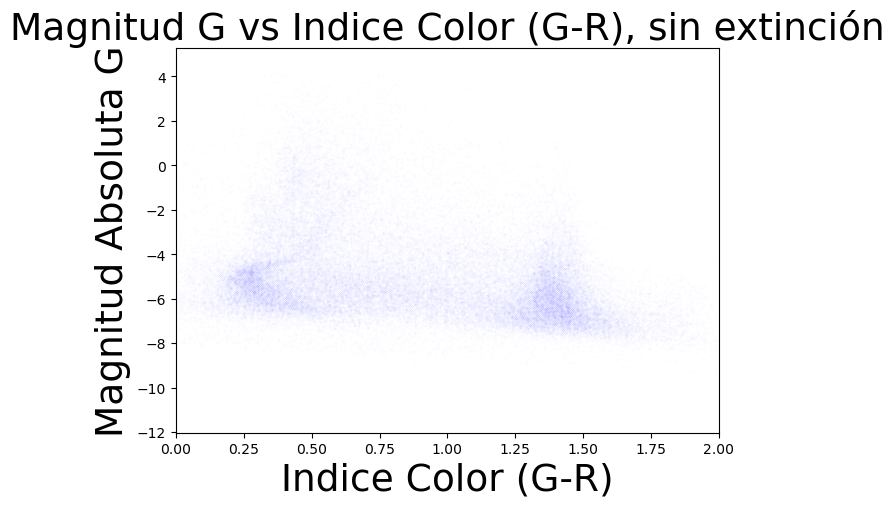

El número de puntos encerrados entre ambas curvas es  19913  para un valor de chi= 1.5
0.008


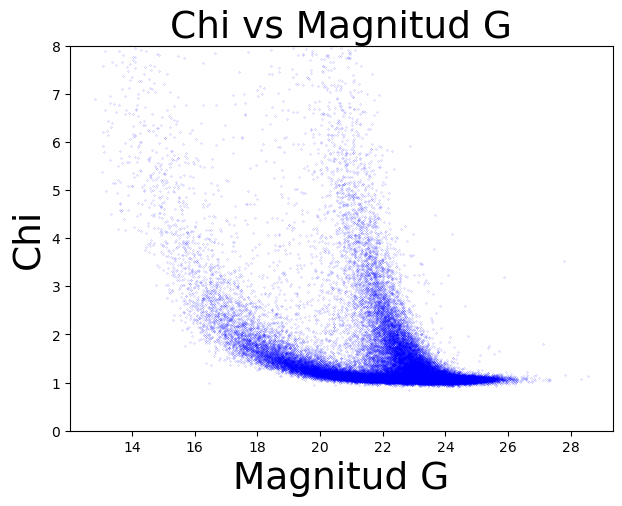

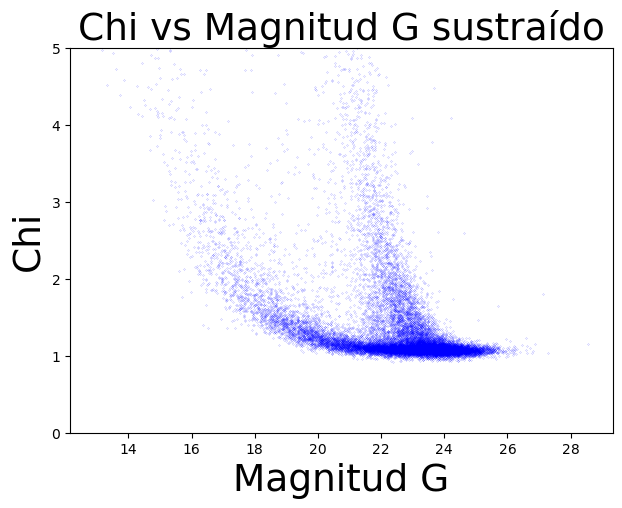

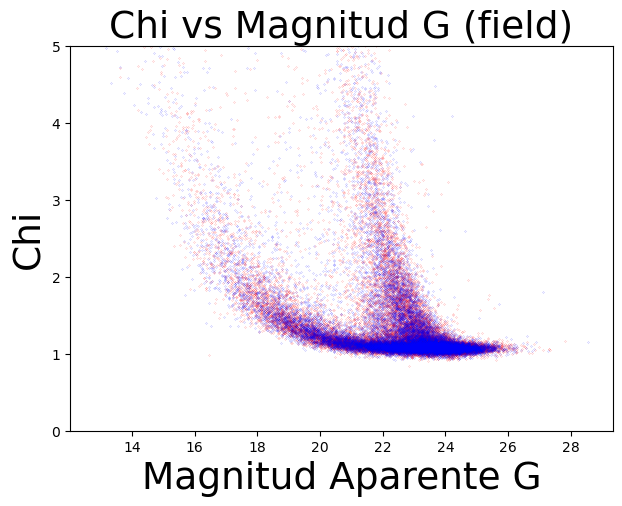

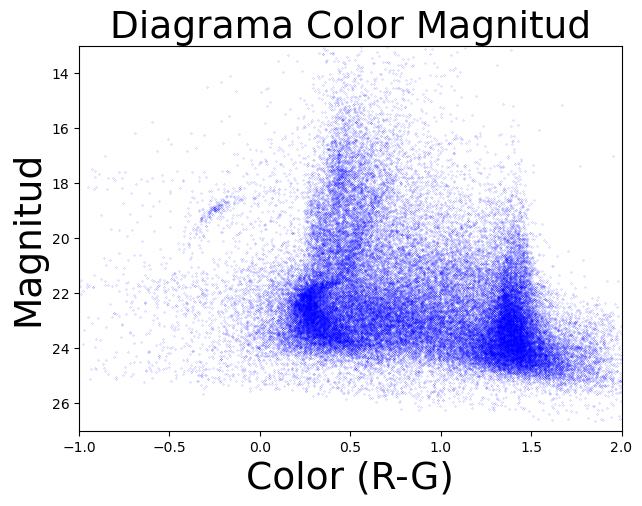

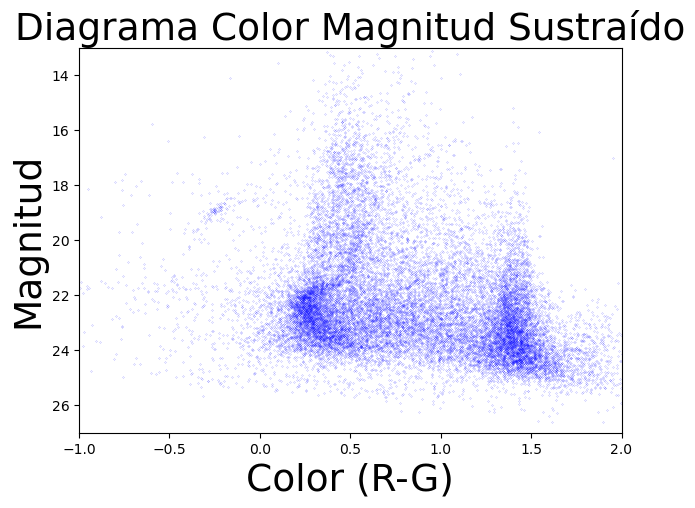

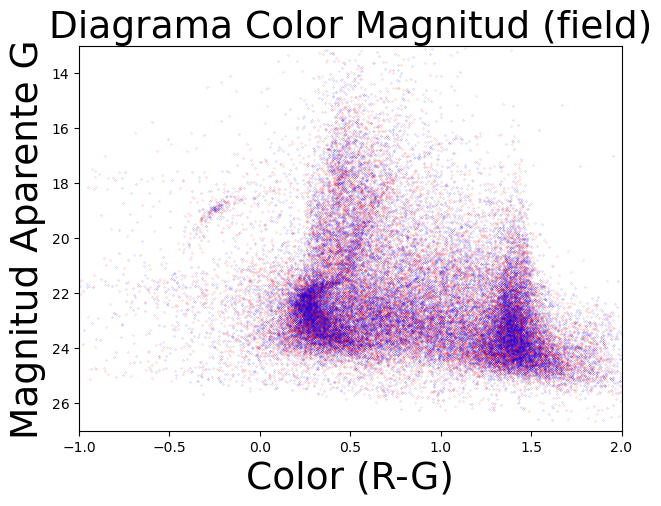

[14.66055, 14.660341, 14.659997, 14.659857, 14.659559]


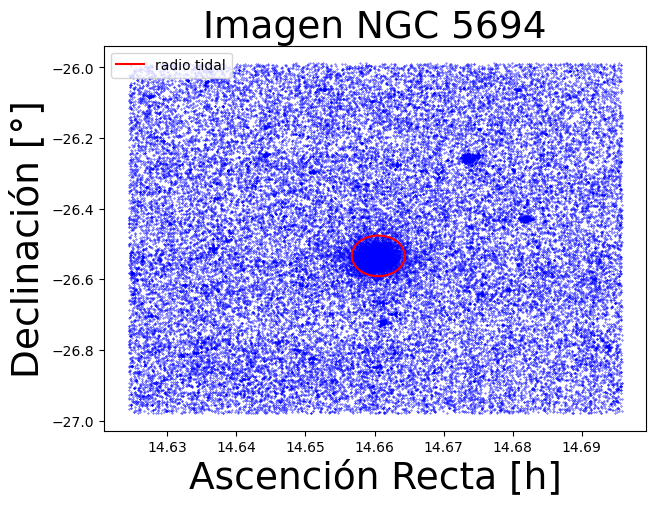

[14.66055, 14.660341, 14.659997, 14.659857, 14.659559]


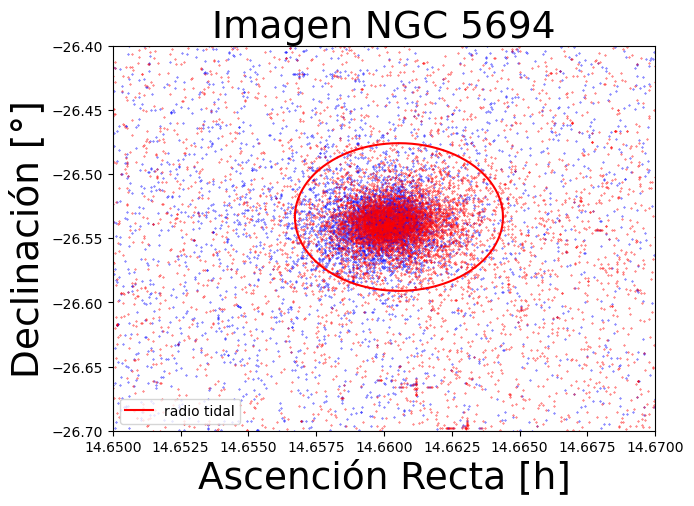

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


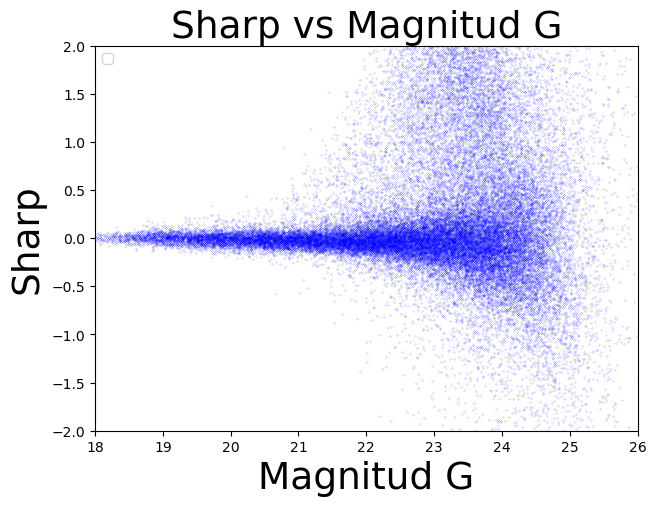

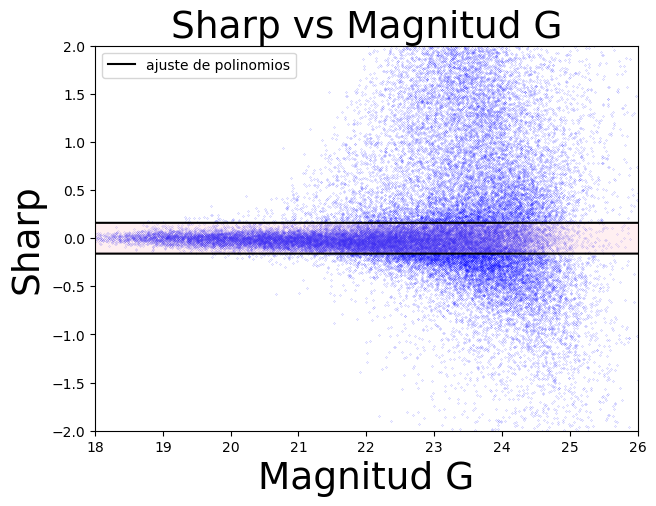

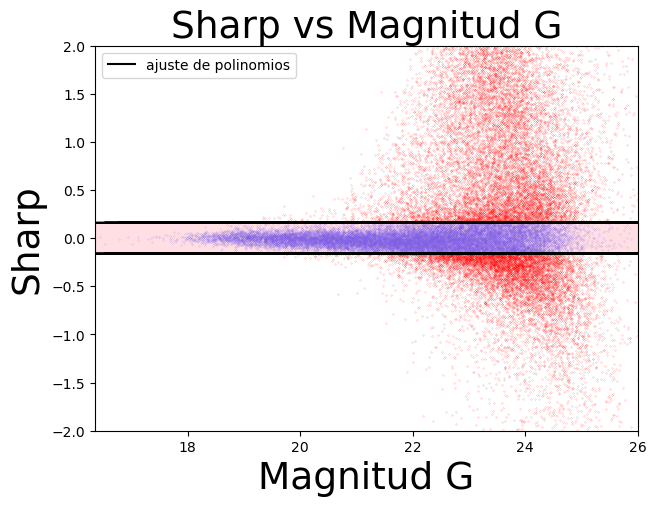

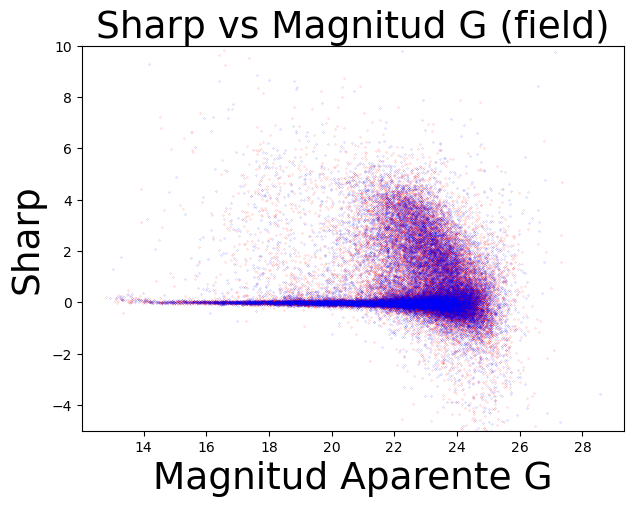

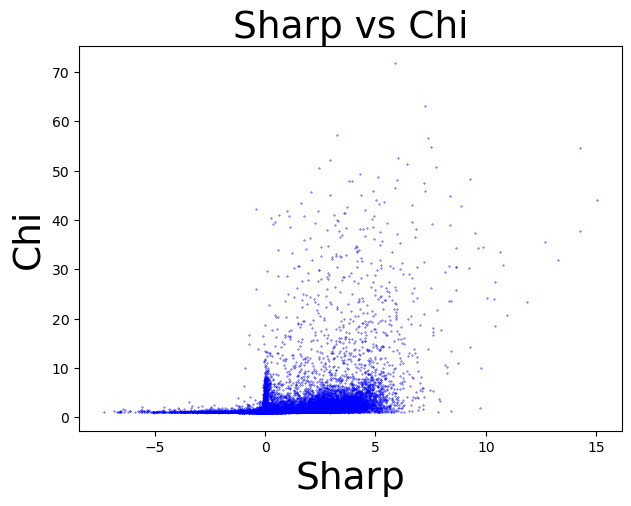

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from statistics import mode
#Algunas definiciones que dio la inteligencia artificial:
#In astronomical image processing, the CHI and SHARP parameters
#are used to classify and quantify the shape of galaxy images. 
#They are morphological parameters that are derived from the 
#moments of the galaxy's light distribution.

#The CHI parameter is a measure of the galaxy's symmetry, 
#calculated as the ratio of the second-order moment (the moment
#about the center of mass) to the square of the first-order moment 
#(the moment about the center of mass). A galaxy with a high CHI 
#value is more elongated, while a galaxy with a low CHI value is 
#more circular.

#The SHARP parameter is a measure of the galaxy's sharpness, 
#calculated as the ratio of the third-order moment (the moment 
#about the center of mass) to the cube of the first-order moment.
#A galaxy with a high SHARP value is more peaked, while a galaxy 
#with a low SHARP value is more diffuse.

#Both CHI and SHARP parameters are used to classify and separate 
#different types of galaxies, such as ellipticals, spirals, and 
#irregulars. These parameters can be calculated using software 
#such as SExtractor, which is a widely used software package for 
#astronomical image processing.

#In image processing and computer vision, moments are used to
#describe the spatial distribution of intensity (or color) in
#an image. There are several types of moments, but the most 
#commonly used are the raw moments, central moments, and standardized
#moments.

#The first-order moment (also called the raw moment or the 
#moment of order 1) is a measure of the total intensity (or color)
#of the image. It is calculated by summing the product of the 
#intensity (or color) of each pixel and its corresponding 
#coordinates. It is typically represented by the letter M 
#and the subscripts p and q, where p and q are the order of 
#the moment in the x and y direction, respectively.

#The second-order moment (also called the central moment or the 
#moment of order 2) is a measure of the spatial distribution of 
#the intensity (or color) around the center of mass of the image.
#It is calculated by summing the product of the difference between
#the coordinates of each pixel and the center of mass coordinates 
#and the intensity (or color) of each pixel. It is typically 
#represented by the letter μ and the subscripts p and q, where 
#p and q are the order of the moment in the x and y direction, 
#respectively.

#The third-order moment (also called the moment of order 3) is
#a measure of the skewness of the image, it is calculated by
#summing the product of the cube of the difference between 
#the coordinates of each pixel and the center of mass 
#coordinates and the intensity (or color) of each pixel. 
#It is typically represented by the letter ν and the subscripts
#p and q, where p and q are the order of the moment in the x 
#and y direction, respectively.

#In the case of the CHI and SHARP parameters that I mentioned 
#earlier, the first-order moment is used to calculate the total
#intensity of the galaxy image, the second-order moment is used
#to calculate the spatial distribution of the intensity around
#the center of mass, and the third-order moment is used to 
#calculate the skewness of the image.

#definimos los datos
df = pd.read_csv('cumulongc5694.csv', delimiter=';', decimal=",")
Cumulos_Globulares = np.array(df)
Cumulos_Globulares = np.float32(Cumulos_Globulares)

#definamos de una vez por todas, todas las columnas,
#Las columnas de datos son, de izquierda a derecha:
# 0) ID Objeto, 1) Right Ascension [degrees] 2) Declination [degrees]
# 3) Magnitud G aparente, 4) error magnitud g, 5) Magnitud R aparente, 
# 6) Error magnitud R, 7) Chi, 8) Sharp, 9) radio al centro del cumulo [arcmin]
# 10) l longitud, 11) latitud b (coordenadas galácticas), 12) extinción 
# A_g, 13) Extinción A_r, 14) Enrojecimiento E(g-r)=A_g-A_r
ID_OBJETO, RA = Cumulos_Globulares[:,0], Cumulos_Globulares[:,1]
DEC, MAG_G = Cumulos_Globulares[:,2], Cumulos_Globulares[:,3]
ERR_G, MAG_R = Cumulos_Globulares[:,4], Cumulos_Globulares[:,5]
ERR_R, CHI = Cumulos_Globulares[:,6], Cumulos_Globulares[:,7]
SHARP, RADIO = Cumulos_Globulares[:,8], Cumulos_Globulares[:,9]
L_GAL, B_GAL = Cumulos_Globulares[:,10], Cumulos_Globulares[:,11]
EXT_G, EXT_R = Cumulos_Globulares[:,12], Cumulos_Globulares[:,13]
ENROJ = Cumulos_Globulares[:,14]

######################################################################
######################################################################
######################################################################
#Algo que nos interesa conocer, es si, obteniendo la magnitud absoluta
#corregida por la extinción, vemos algo diferente 
#a la secuencia principal 

#podemos obtener la distancia de "A NEW CATALOG OF ORBITS OF 152 GLOBULAR
#CLUSTERS FROM Gaia EDR3", A. T. Bajkova, V. V. Bobylev (2022)
d=29100 #parsecs
#podemos asumir la misma distancia para todos los puntos, para simplificar
#el calculo
Magnitud_Absoluta_G = MAG_G - 5*np.log10(d) + 5 - EXT_G
Magnitud_Absoluta_R = MAG_R - 5*np.log10(d) + 5 - EXT_R
Magnitud_Absoluta_G2 = MAG_G - 5*np.log10(d) + 5
Magnitud_Absoluta_R2 = MAG_R - 5*np.log10(d) + 5
Indice_Color_Absoluto = Magnitud_Absoluta_G - Magnitud_Absoluta_R
Indice_Color_Absoluto2 = Magnitud_Absoluta_G2 - Magnitud_Absoluta_R2

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111)
plt.scatter(Indice_Color_Absoluto, -Magnitud_Absoluta_G, s=0.0001, color='blue')
plt.title('Magnitud G vs Indice Color (G-R), corrección por extinción', fontsize=27)
plt.xlabel('Indice Color (G-R)', fontsize=27)
plt.ylabel('Magnitud Absoluta G', fontsize=27)
plt.xlim(0,2)
plt.show()
#Ahora hacemos otro gráfico pero no tomando en consideración la extinción
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111)
plt.scatter(Indice_Color_Absoluto2, -Magnitud_Absoluta_G2, s=0.0001, color='blue')
plt.title('Magnitud G vs Indice Color (G-R), sin extinción', fontsize=27)
plt.xlabel('Indice Color (G-R)', fontsize=27)
plt.ylabel('Magnitud Absoluta G', fontsize=27)
plt.xlim(0,2)
plt.show()

##############################################################
##############################################################
##############################################################

chi_critico = 1.5
MG = []
Sharp = [] 
for i in range(1, len(CHI)):
    if CHI[i] < chi_critico:
        Sharp += [SHARP[i]]
        MG += [MAG_G[i]]
Sharp = np.array(Sharp)
MG = np.array(MG)

inclinacion = 10
s = 23
base = 0.
# pol nos dice qué valor por arriba y por abajo de 0, comienza cada uno de los polinomios xd
pol = .16
A,B,C,D = base, inclinacion, -base, inclinacion

Mg = MG
x = np.sort(Mg)
X = np.sort(MAG_G)
polinomio_sup = A*np.exp(B*(x-s))+pol
polinomio_inf = C*np.exp(D*(x-s))-pol
POLINOMIO_SUP = A*np.exp(B*(X-s))+pol
POLINOMIO_INF = C*np.exp(D*(X-s))-pol

lista_sharp = []
indices_fuera = []
indices = []
for i in range(1, len(Sharp)):
    if Sharp[i] < polinomio_sup[i] and Sharp[i] > polinomio_inf[i]:
        lista_sharp+=[Sharp[i]]
        indices += [i]
    else:
        indices_fuera+=[i]
lista_sharp = np.array(lista_sharp)
indices = np.array(indices)
indices_fuera = np.array(indices_fuera)
print("El número de puntos encerrados entre ambas curvas es ",len(lista_sharp),
      " para un valor de chi=", chi_critico)


#Ahora podemos definir las funciones que son las que tienen sustraídos datos debido
#al parámetro morfológico chi/sharp:
def sharp_chi():
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.scatter(SHARP, CHI , s=0.1, color='blue')
    plt.title('Sharp vs Chi', fontsize=27)
    plt.xlabel('Sharp', fontsize=27)
    plt.ylabel('Chi', fontsize=27)
    plt.show()

def Color_Magnitud(p):
    indice = MAG_G-MAG_R
    Magnitud = MAG_G
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.scatter(indice, Magnitud , s=p, color='blue')
    plt.title('Diagrama Color Magnitud', fontsize=27)
    plt.xlabel('Color (R-G)', fontsize=27)
    plt.ylabel('Magnitud', fontsize=27)
    ax.invert_yaxis()
    plt.xlim(-1,2)
    plt.ylim(27, 13)
    plt.show()

def CDM_sustraido():
    indice_nuevo = (MAG_G-MAG_R)[indices]
    magnitud_nueva = MAG_G[indices]
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.scatter(indice_nuevo, magnitud_nueva , s=0.01, color='blue')
    plt.title('Diagrama Color Magnitud Sustraído', fontsize=27)
    plt.xlabel('Color (R-G)', fontsize=27)
    plt.ylabel('Magnitud', fontsize=27)
    ax.invert_yaxis()
    plt.xlim(-1,2)
    plt.ylim(27, 13)
    plt.show()

def CDM_field():
    indice_color = (MAG_G-MAG_R)
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.scatter(indice_color[indices_fuera], MAG_G[indices_fuera] , s=0.01, color = "red")
    plt.scatter(indice_color[indices], MAG_G[indices] , s=0.01, color = "blue")
    plt.title('Diagrama Color Magnitud (field)', fontsize=27)
    plt.xlabel('Color (R-G)', fontsize=27)
    plt.ylabel('Magnitud Aparente G', fontsize=27)
    ax.invert_yaxis()
    plt.xlim(-1,2)
    plt.ylim(27, 13)
    plt.show()
###################################################################
def Imagen_NGC(angulo_tidal):
    num_segmentos = 100
    rad = angulo_tidal/2
    #queremos conocer el centro de la figura
    dec = []
    ra = []
    for i in range(len(RA)):
        if RADIO[i]==.5:
            dec += [DEC[i]]
            ra += [RA[i]]
    print(ra)
    ra = np.array(ra)
    dec = np.array(dec)
    cx, cy = ra[0], dec[0]
    angulo = np.linspace(0, 2*np.pi, num_segmentos+1)
    x = ((rad /15)* np.cos(angulo) + cx)
    y = (rad * np.sin(angulo) + cy)   
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.plot(x, y, color="red", markersize=1, label='radio tidal')
    plt.scatter(RA, DEC, s=0.1, color='blue')
    plt.title('Imagen NGC 5694', fontsize=27)
    plt.xlabel('Ascención Recta [h]', fontsize=27)
    plt.ylabel('Declinación [°]', fontsize=27)
    plt.legend()
    plt.show()

def Imagen_NGC_sustraida(angulo_tidal):
    num_segmentos = 100
    rad = angulo_tidal/2
    dec = []
    ra = []
    for i in range(len(RA)):
        if RADIO[i]==.5:
            dec += [DEC[i]]
            ra += [RA[i]]
    print(ra)
    ra = np.array(ra)
    dec = np.array(dec)
    cx, cy = ra[0], dec[0]
    angulo = np.linspace(0, 2*np.pi, num_segmentos+1)
    x = ((rad /15)* np.cos(angulo) + cx )
    y = (rad * np.sin(angulo) + cy)   
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.plot(x, y, color="red", markersize=1, label='radio tidal')
    plt.scatter(RA[indices], DEC[indices], s=0.1, color='blue')
    plt.scatter(RA[indices_fuera], DEC[indices_fuera], s=0.1, color='red')
    plt.title('Imagen NGC 5694', fontsize=27)
    plt.xlabel('Ascención Recta [h]', fontsize=27)
    plt.ylabel('Declinación [°]', fontsize=27)
    plt.xlim(14.65, 14.67)
    plt.ylim(-26.7,-26.4)
    plt.legend()
    plt.show()

#####################################################################

def g_chi():
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.scatter(MAG_G, CHI , s=0.01, color='blue')
    plt.title('Chi vs Magnitud G', fontsize=27)
    plt.xlabel('Magnitud G', fontsize=27)
    plt.ylabel('Chi', fontsize=27)
    plt.ylim(0,8)
    plt.show()

def g_chi_sustraido():
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.scatter(MAG_G[indices], CHI[indices] , s=0.01, 
                label='cluster stars', color='blue')
    plt.title('Chi vs Magnitud G sustraído', fontsize=27)
    plt.xlabel('Magnitud G', fontsize=27)
    plt.ylabel('Chi', fontsize=27)
    plt.ylim(0,5)
    plt.show()
    
def g_chi_field():
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.scatter(MAG_G[indices_fuera], CHI[indices_fuera] , s=0.01, color='red',label='cluster stars')
    plt.scatter(MAG_G[indices], CHI[indices] , s=0.01, color='blue', label='field objects')
    plt.title('Chi vs Magnitud G (field)', fontsize=27)
    plt.xlabel('Magnitud Aparente G', fontsize=27)
    plt.ylabel('Chi', fontsize=27)
    plt.ylim(0,5)
    plt.show()

#########################################################################
def g_sharp_no(Sharp, MG,a,b, c, d, s, pol):
    sharp = Sharp
    Mg = MG
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.scatter(Mg, sharp , s=0.01, color='blue')
    plt.title('Sharp vs Magnitud G', fontsize=27)
    plt.xlabel('Magnitud G', fontsize=27)
    plt.ylabel('Sharp', fontsize=27)
    plt.xlim(18,26) 
    plt.ylim(-2,2)
    plt.legend()
    plt.show()

def g_sharp(Sharp, MG,a,b, c, d, s, pol):
    sharp = Sharp
    Mg = MG
    x = np.sort(Mg)
    polinomio_sup = a*np.exp(b*(x-s))+pol
    polinomio_inf = c*np.exp(d*(x-s))-pol
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.scatter(Mg, sharp , s=0.01, color='blue')
    
    ax.plot(x, polinomio_sup, color='black', label='ajuste de polinomios')
    ax.plot(x, polinomio_inf, color='black')
    plt.fill_between(x, polinomio_inf, polinomio_sup, 
                     facecolor='pink', alpha=0.25)
    plt.title('Sharp vs Magnitud G', fontsize=27)
    plt.xlabel('Magnitud G', fontsize=27)
    plt.ylabel('Sharp', fontsize=27)
    plt.xlim(18,26) 
    plt.ylim(-2,2)
    plt.legend()
    plt.show()

def g_sharp_reducido(Sharp1, MG1,a,b, c, d, s, pol):
    sharp1 = Sharp1
    Mg1 = MG1
    
    x = Mg1
    polinomio_sup = a*np.exp(b*((x-s)))+pol
    polinomio_inf = c*np.exp(d*((x-s)))-pol
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.scatter(MG1[indices], sharp1[indices] , s=0.01, color='blue')
    plt.scatter(MG1[indices_fuera], sharp1[indices_fuera] , 
                s=0.01, color='red')
    
    ax.plot(x, polinomio_sup, color='black',
            label='ajuste de polinomios')
    ax.plot(x, polinomio_inf, color='black')
    plt.fill_between(np.sort(x), polinomio_inf, 
                     polinomio_sup, facecolor='pink', alpha=0.5)
    plt.title('Sharp vs Magnitud G', fontsize=27)
    plt.xlabel('Magnitud G', fontsize=27)
    plt.ylabel('Sharp', fontsize=27)
    plt.xlim(min(Mg1[indices]),26) 
    plt.ylim(-2,2)
    plt.legend()
    plt.show()

def G_SHARP_field():
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.scatter(MAG_G[indices_fuera], SHARP[indices_fuera] , 
                s=0.01, color = "red")
    plt.scatter(MAG_G[indices], SHARP[indices] , s=0.01, color = "blue")
    plt.title('Sharp vs Magnitud G (field)', fontsize=27)
    plt.xlabel('Magnitud Aparente G', fontsize=27)
    plt.ylabel('Sharp', fontsize=27)
    plt.ylim(-5,10)
    plt.show()
#########################################################################


#comparacion de graficos

print(min(RADIO))
g_chi()
g_chi_sustraido()
g_chi_field()

Color_Magnitud(0.01)
CDM_sustraido()
CDM_field()

Imagen_NGC(angulo_radio5694/15)
Imagen_NGC_sustraida(angulo_radio5694/15)

g_sharp_no(Sharp, MG, A,B,C,D, s, pol)
g_sharp(Sharp, MG, A,B,C,D, s, pol)
g_sharp_reducido(Sharp, MG, A,B,C,D, s, pol)
G_SHARP_field()
sharp_chi()

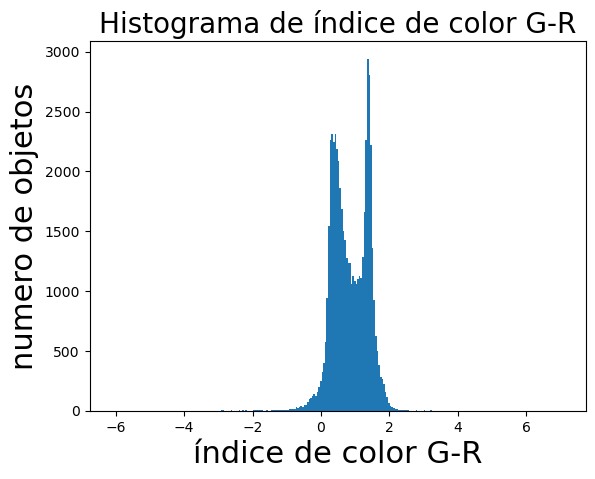

In [10]:
hist, bins = np.histogram(MAG_G-MAG_R, bins='auto')
plt.hist(MAG_G-MAG_R, bins='auto')
plt.ylabel('numero de objetos', fontsize=22)
plt.xlabel('índice de color G-R', fontsize=22)
plt.title('Histograma de índice de color G-R', fontsize=20)
plt.show()

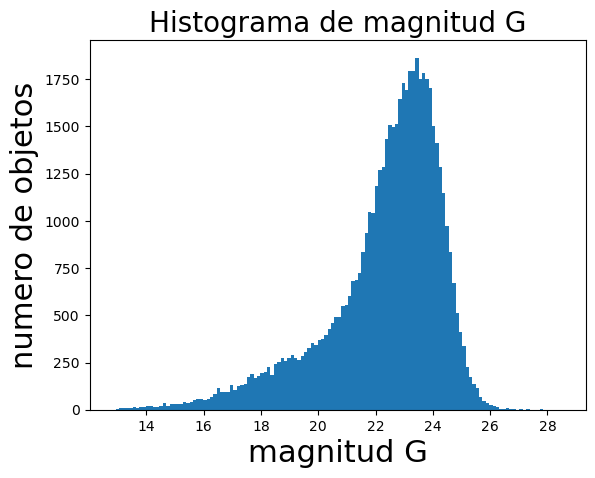

In [12]:
hist, bins = np.histogram(MAG_G, bins='auto')
plt.hist(MAG_G, bins='auto')
plt.ylabel('numero de objetos', fontsize=22)
plt.xlabel('magnitud G', fontsize=22)
plt.title('Histograma de magnitud G', fontsize=20)
plt.show()

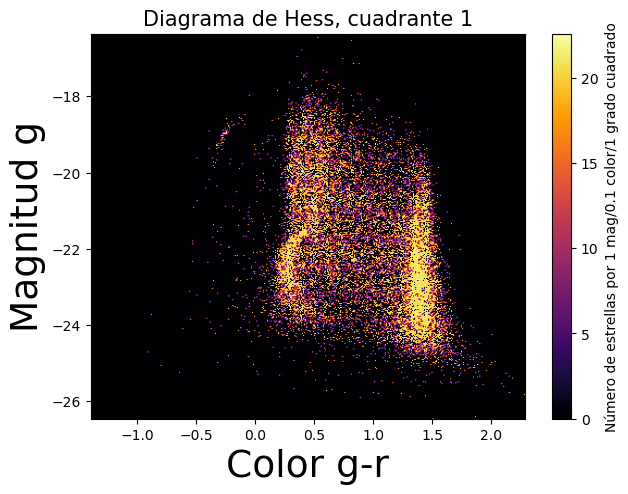

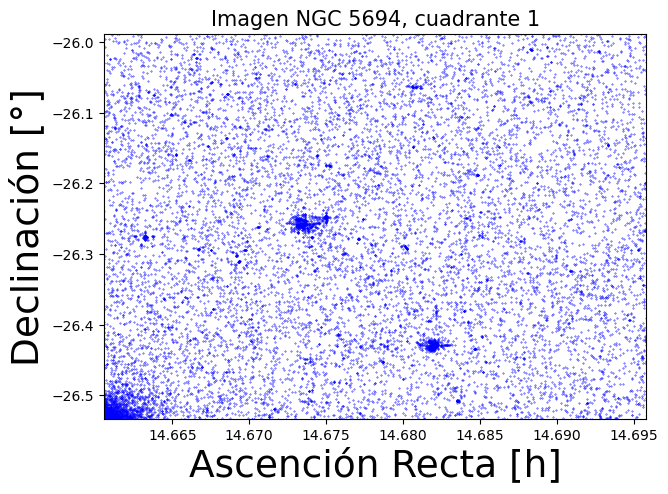

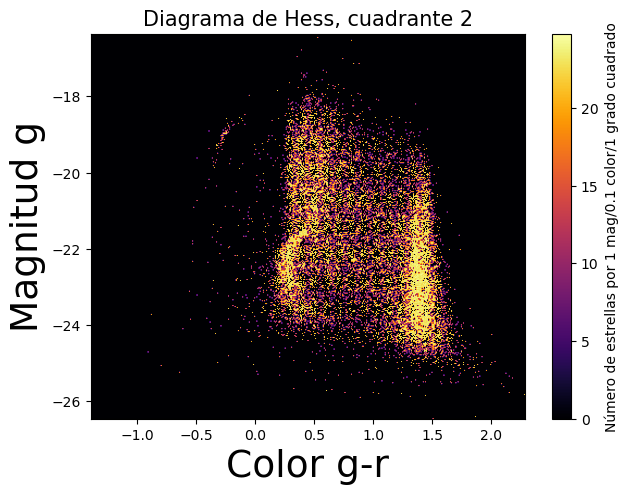

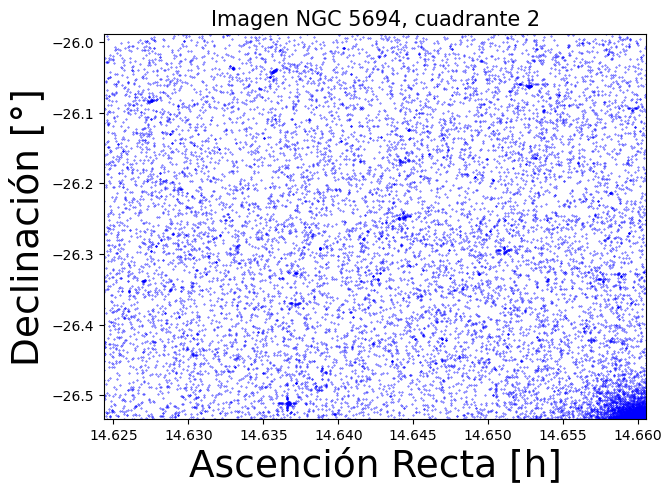

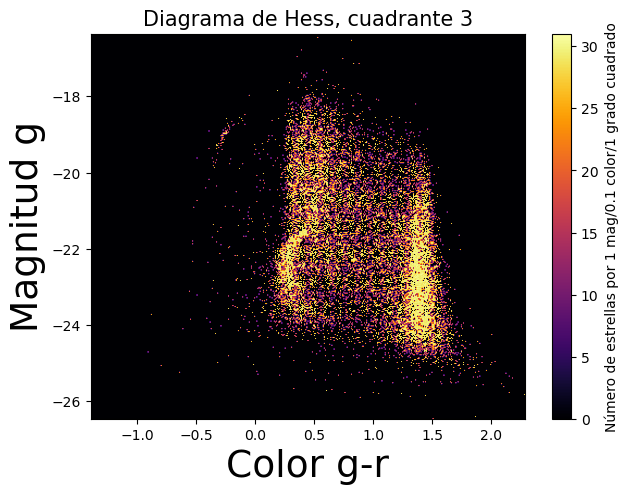

...

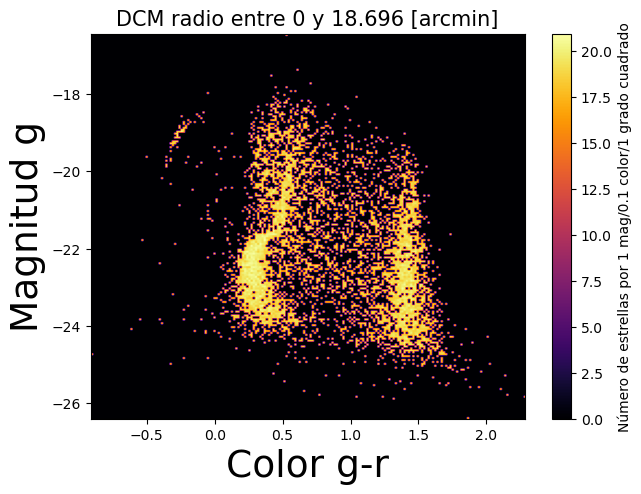

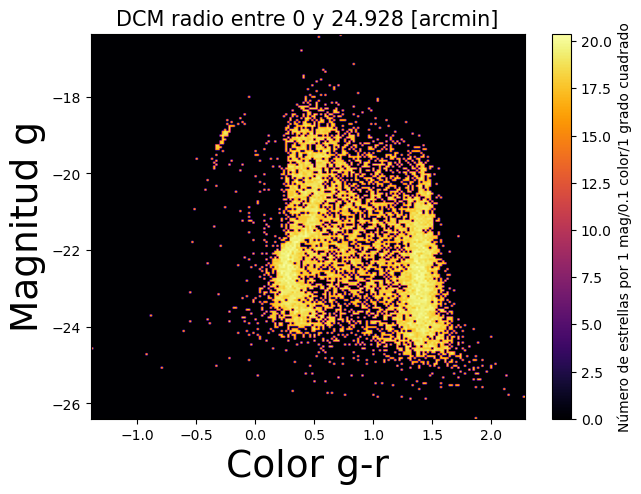

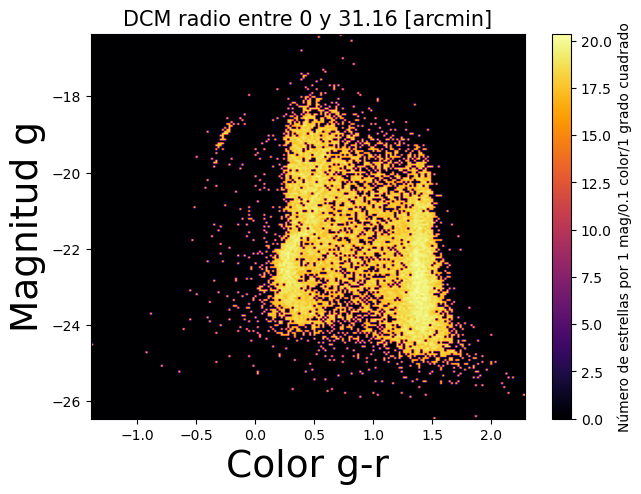

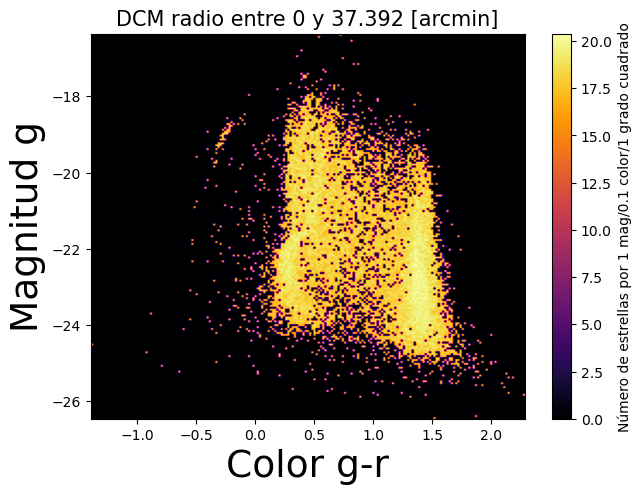

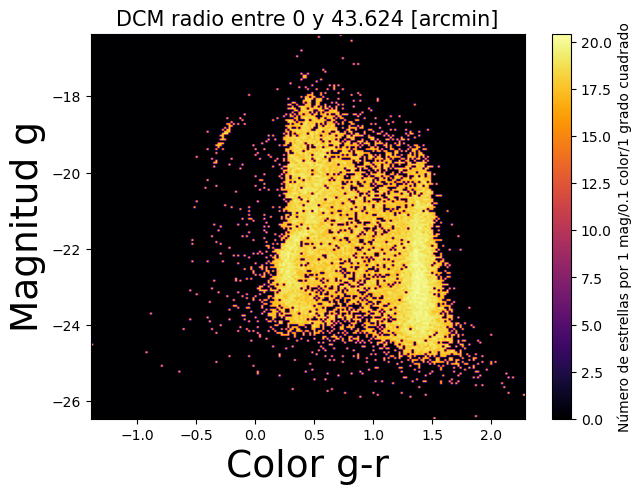

IndexError: index 16 is out of bounds for axis 0 with size 15

In [5]:
import numpy as np
import matplotlib.pyplot as plt
#Ahora queremos hacer el diagrama de Hess para diferentes intervalos de radios
#1) 0-radio tidal, 1rt-2rt, 2rt-3rt, 3rt-4rt, 4rt-5rt, 5rt-6rt

def hess_cuadrante(cuadrante):
    arr1 = [CHI<chi_critico]
    arr2 = np.array([a < b for a, b in zip(SHARP, POLINOMIO_SUP)])
    arr3 = np.array([a > b for a, b in zip(SHARP, POLINOMIO_INF)])
    arr6 = arr1 & arr2 & arr3
    arr7 = arr6.tolist()
    g = -MAG_G[tuple(arr7)] # Apparent Magnitude values
    g_r = (MAG_G-MAG_R)[tuple(arr7)]   # g-r color index values
    ra = RA[tuple(arr7)] # Right Ascension values
    dec = DEC[tuple(arr7)]*15  # Declination values
    if cuadrante == 3:
        dec = dec[:int((max(RA))/2)]
        ra = ra[:int((max(RA))/2)]
    elif cuadrante == 4:
        dec = dec[int((max(RA))/2)+1:]
        ra = ra[:int((max(RA))/2)]
    elif cuadrante == 2:
        dec = dec[:int((max(RA))/2)]
        ra = ra[int((max(RA))/2)+1:]
    elif cuadrante == 1:
        dec = dec[int((max(RA))/2)+1:]
        ra = ra[int((max(RA))/2)+1:]
    g_bins = np.linspace(g.min(), g.max(), 400)
    g_r_bins = np.linspace(g_r.min(), g_r.max(), 400)
    ra_bins = np.linspace(ra.min(), ra.max(), 400)
    dec_bins = np.linspace(dec.min(), dec.max(), 400)
    H, xedges, yedges = np.histogram2d(g_r, g, bins=(g_r_bins, g_bins))
    H = H / ((g_bins[1]-g_bins[0])*(g_r_bins[1]-g_r_bins[0])*
             ((ra_bins[1]-ra_bins[0]))*((dec_bins[1]-dec_bins[0])))
    matrix=H.T
    mask = matrix != 0
    result = np.zeros(matrix.shape)
    result[mask] = np.log(matrix[mask])
    plt.figure(figsize=(7,5))
    plt.imshow(result, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
           aspect='auto', cmap='inferno', vmin=0)
    plt.ylabel('Magnitud g', fontsize=27)
    plt.xlabel('Color g-r', fontsize=27)
    plt.title('Diagrama de Hess, cuadrante '+str(cuadrante), fontsize=15)
    plt.colorbar(label='Número de estrellas por 1 mag/0.1 color/1 grado cuadrado')
    plt.show()
    
def Imagen_NGC_cuadrantes(angulo_tidal, cuadrante):
    num_segmentos = 100
    rad = angulo_tidal/2
    #queremos conocer el centro de la figura
    dec = []
    ra = []
    for i in range(len(RA)):
        if RADIO[i]==.5:
            dec += [DEC[i]]
            ra += [RA[i]]
    ra = np.array(ra)
    dec = np.array(dec)
    cx, cy = ra[0], dec[0]
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111)
    plt.scatter(RA, DEC, s=0.1, color='blue')
    plt.title('Imagen NGC 5694, cuadrante '+str(cuadrante), fontsize=15)
    plt.xlabel('Ascención Recta [h]', fontsize=27)
    plt.ylabel('Declinación [°]', fontsize=27)
    if cuadrante == 1:
        plt.xlim(cx, max(RA))
        plt.ylim(cy, max(DEC))
    elif cuadrante == 2:
        plt.xlim(min(RA),cx)
        plt.ylim(cy, max(DEC))
    elif cuadrante == 3:
        plt.xlim(min(RA), cx)
        plt.ylim(min(DEC), cy)
    elif cuadrante == 4:
        plt.xlim(cx, max(RA))
        plt.ylim(min(DEC), cy)
    plt.show()
    
#cómo podemos calcular el cuadrante? esto lo podemos hacer de la siguiente manera
#cuadrante 1: LA PRIMERA MITAD DE LOS DATOS

for i in [1,2,3,4]:
    hess_cuadrante(i)
    Imagen_NGC_cuadrantes(angulo_radio5694, i)

def hess_radio(rmin=0, rmax=10):
    arr1 = [CHI<chi_critico]
    arr2 = np.array([a < b for a, b in zip(SHARP, POLINOMIO_SUP)])
    arr3 = np.array([a > b for a, b in zip(SHARP, POLINOMIO_INF)])
    arr4 = [RADIO>rmin]
    arr5 = [RADIO<rmax]
    arr6 = arr1 & arr2 & arr3 & arr4 & arr5
    arr7 = arr6.tolist()
    g = -MAG_G[tuple(arr7)] # Apparent Magnitude values
    g_r = (MAG_G-MAG_R)[tuple(arr7)]   # g-r color index values
    ra = RA[tuple(arr7)] # Right Ascension values [°]
    dec = DEC[tuple(arr7)]*15  # Declination values

    # Define the bin edges for the Hess diagram
    g_bins = np.linspace(g.min(), g.max(), 200)
    g_r_bins = np.linspace(g_r.min(), g_r.max(), 200)
    ra_bins = np.linspace(ra.min(), ra.max(), 200)
    dec_bins = np.linspace(dec.min(), dec.max(), 200)

    # Create the 2D histogram using the numpy histogram2d function
    H, xedges, yedges = np.histogram2d(g_r, g, bins=(g_r_bins, g_bins))
    H2, xedges2, yedges2 = np.histogram2d(ra, dec, bins=(ra_bins, dec_bins))    

    # Normalize the histogram by the bin area
    H = H / ((g_bins[1]-g_bins[0])*(g_r_bins[1]-g_r_bins[0])*((ra_bins[1]-ra_bins[0]))*((dec_bins[1]-dec_bins[0])))
    H2 = H2 / ((g_bins[1]-g_bins[0])*(g_r_bins[1]-g_r_bins[0])*((ra_bins[1]-ra_bins[0]))*((dec_bins[1]-dec_bins[0])))

    matrix=H.T
    mask = matrix != 0
    result = np.zeros(matrix.shape)
    result[mask] = np.log(matrix[mask])
    
    matrix2 = H2.T
    mask22 = matrix2 != 0
    result2 = np.zeros(matrix2.shape)
    result2[mask22] = np.log(matrix2[mask22])
    
    # Plot the Hess diagram using the imshow function from matplotlib
    plt.figure(figsize=(7,5))
    plt.imshow(result, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
           aspect='auto', cmap='inferno', vmin=0)
    
    plt.title('DCM radio entre '+str(round(rmin,3))+' y '+str(round(rmax,3))+' [arcmin]', fontsize=15)
    plt.ylabel('Magnitud g', fontsize=27)
    plt.xlabel('Color g-r', fontsize=27)

    #plt.xlim(0,1.8)
    #plt.ylim(-25,-18)
    plt.colorbar(label='Número de estrellas por 1 mag/0.1 color/1 grado cuadrado')
    plt.show()
    
    #plt.imshow(result2, origin='lower', extent=[xedges2[0], xedges2[-1], yedges2[0], yedges2[-1]],
    #           aspect='auto', cmap='inferno', vmin=0)
    #plt.show()

#Algo que nos interesaría hacer es fijarnos en una imagen o hess diagram en el cual se pueda distinguir 
#la secuencia principal de la densidad de fondo, por ende, nos hemos de fijar en el punto en el que 
#
    
#queremos graficar un histograma:
def histograma():
    arr1 = [CHI<chi_critico]
    arr2 = np.array([a < b for a, b in zip(SHARP, POLINOMIO_SUP)])
    arr3 = np.array([a > b for a, b in zip(SHARP, POLINOMIO_INF)])
    arr6 = arr1 & arr2 & arr3
    arr6 = arr6.tolist()
    RADIUS = RADIO[tuple(arr6)]
    plt.figure(figsize=(7,5))
    hist, bin_edges = np.histogram(RADIUS, bins=100)
    plt.bar(bin_edges[:-1], hist, width=bin_edges[1]-bin_edges[0])
    plt.axvline(x=5.93, ymin=0, ymax=400, color='red', label='radio tidal')
    plt.xlabel('Radio [arcmin]', fontsize=27)
    plt.ylabel('Número de Estrellas', fontsize=27)
    plt.legend()
    plt.show()

#histograma()
#Imagen_NGC_sustraida(angulo_radio5694/15)
a = np.linspace(0,max(RADIO),15)
for i in range(0,len(a)-1):
    hess_radio(0, a[2*(i+1)])


#for i in np.arange(1, 25,1):
#    hess_radio(i,i+1)


#en base a estos resultados, es posible que el cúmulo globular esté extendido hasta los 9.3 arcmin


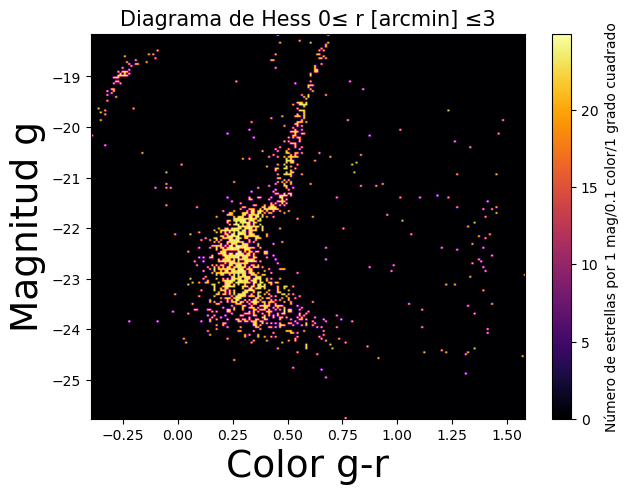

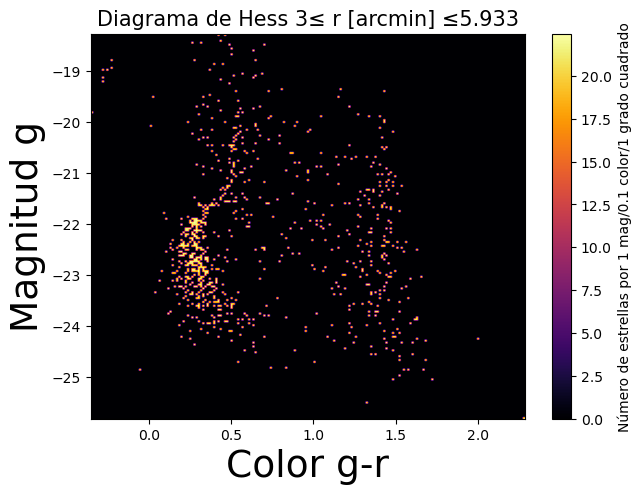

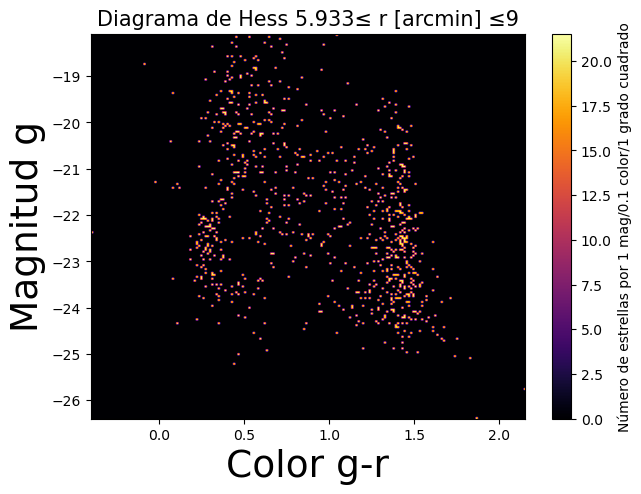

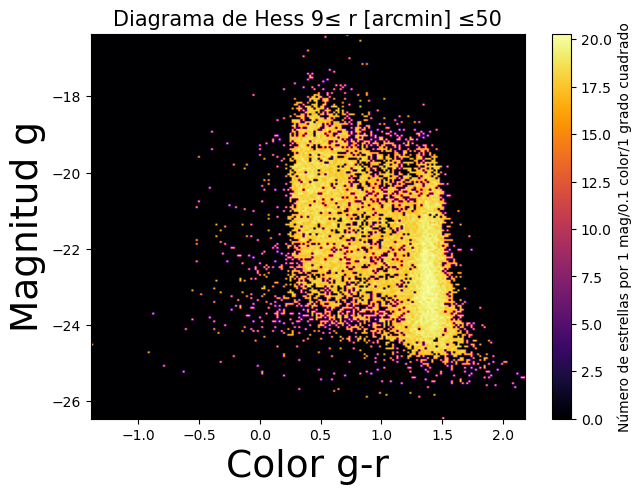

In [13]:
import numpy as np
import matplotlib.pyplot as plt

def hess_radio_snr(rmin=0, rmax=10):
    arr1 = [CHI < chi_critico]
    arr2 = np.array([a < b for a, b in zip(SHARP, POLINOMIO_SUP)])
    arr3 = np.array([a > b for a, b in zip(SHARP, POLINOMIO_INF)])
    arr4 = [RADIO > rmin]
    arr5 = [RADIO < rmax]
    arr6 = arr1 & arr2 & arr3 & arr4 & arr5
    arr7 = arr6.tolist()
    g = -MAG_G[tuple(arr7)] # Apparent Magnitude values
    g_r = (MAG_G - MAG_R)[tuple(arr7)]   # g-r color index values
    ra = RA[tuple(arr7)] # Right Ascension values [°]
    dec = DEC[tuple(arr7)] * 15  # Declination values

    # Define the bin edges for the Hess diagram
    g_bins = np.linspace(g.min(), g.max(), 200)
    g_r_bins = np.linspace(g_r.min(), g_r.max(), 200)
    ra_bins = np.linspace(ra.min(), ra.max(), 200)
    dec_bins = np.linspace(dec.min(), dec.max(), 200)

    # Create the 2D histogram using the numpy histogram2d function
    H, xedges, yedges = np.histogram2d(g_r, g, bins=(g_r_bins, g_bins))

    # Normalize the histogram by the bin area
    H = H / ((g_bins[1] - g_bins[0]) * (g_r_bins[1] - g_r_bins[0]) * ((ra_bins[1] - ra_bins[0])) * ((dec_bins[1] - dec_bins[0])))

    matrix = H.T
    mask = matrix != 0
    result = np.zeros(matrix.shape)
    result[mask] = np.log(matrix[mask])#np.log(matrix[mask])

    # Plot the Hess diagram using the imshow function from matplotlib
    plt.figure(figsize=(7,5))
    plt.imshow(result, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
               aspect='auto', cmap='inferno', vmin=0)
    titulo = str(round(rmin, 3)) + '≤ r [arcmin] ≤' + str(round(rmax, 3))
    plt.title('Diagrama de Hess ' + titulo , fontsize=15)
    plt.ylabel('Magnitud g', fontsize=27)
    plt.colorbar(label='Número de estrellas por 1 mag/0.1 color/1 grado cuadrado')
    plt.xlabel('Color g-r', fontsize=27)
    texto =titulo
    plt.annotate(texto, xy=(0.5, 0.5), xytext=(0.3, 0.7),
             arrowprops=dict(facecolor='white', arrowstyle='->'))
    plt.show()
#print(angulo_radio5694.to(u.arcmin))
radio_x = 5.933
lista = [0,3 , radio_x ,9]
for i in range(len(lista)-1):
    hess_radio_snr(lista[i], lista[i+1])
hess_radio_snr(9, 50)

ahora el gráfico del enrojecimiento versus las coordenadas: 


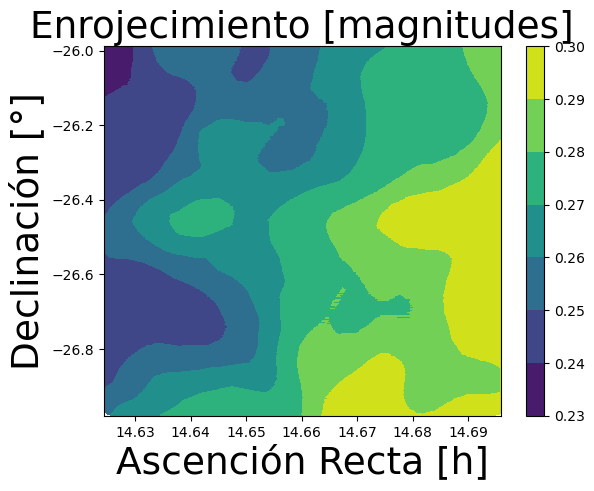

ahora el gráfico de extinción versus las coordenadas: 


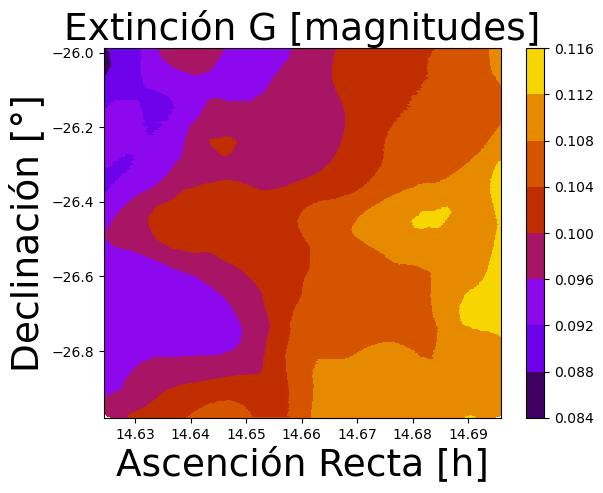

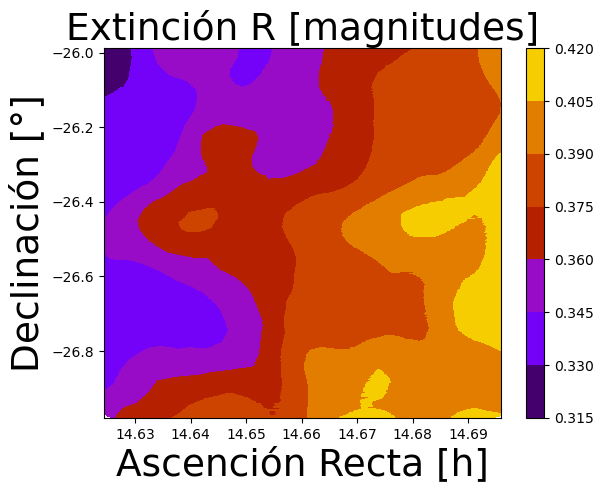

ahora los gráficos de las magnitudes g y r versus las coordenadas: 


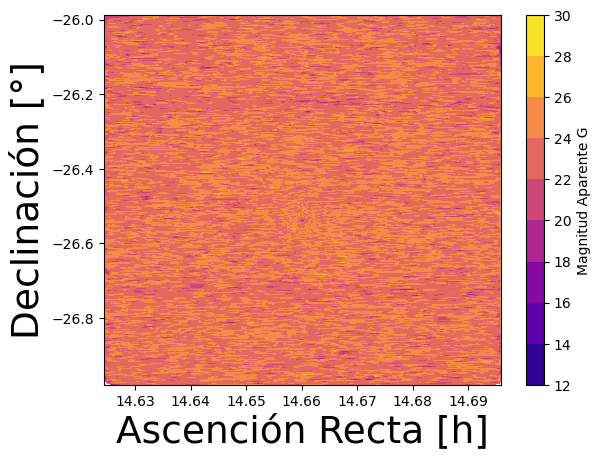

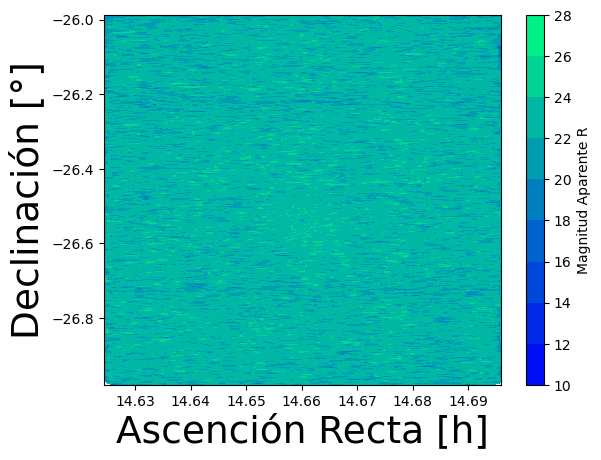

ahora los gráficos de chi y sharp versus las coordenadas: 


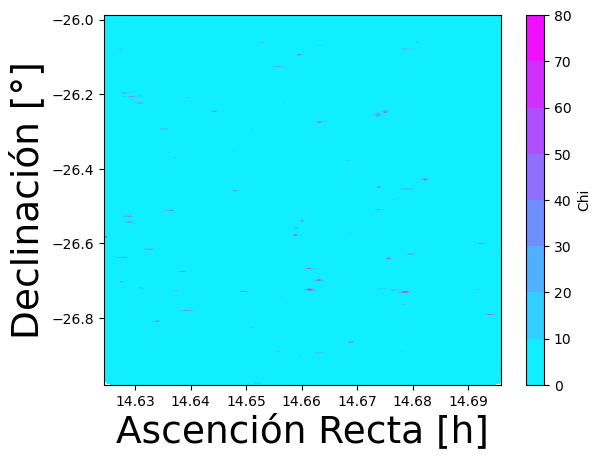

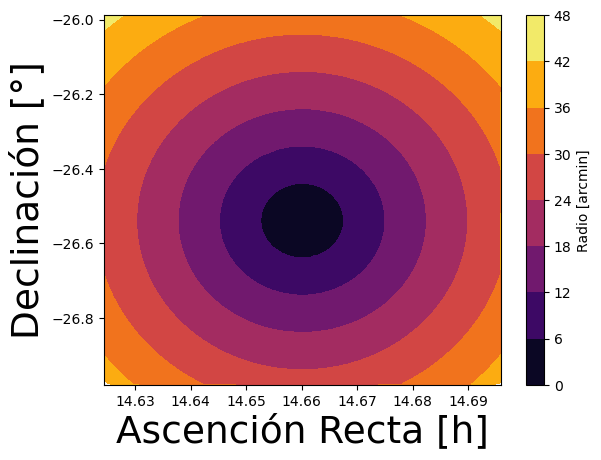

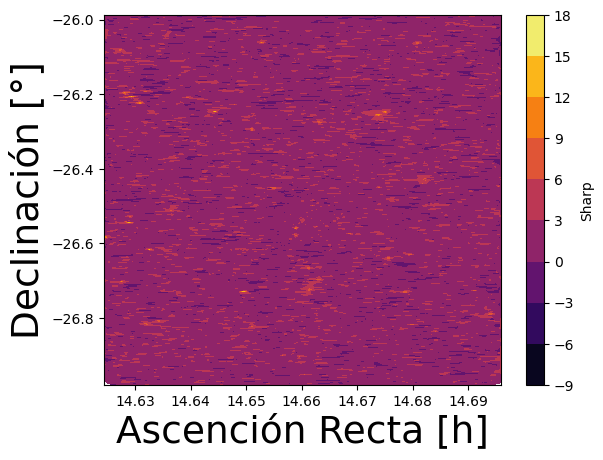

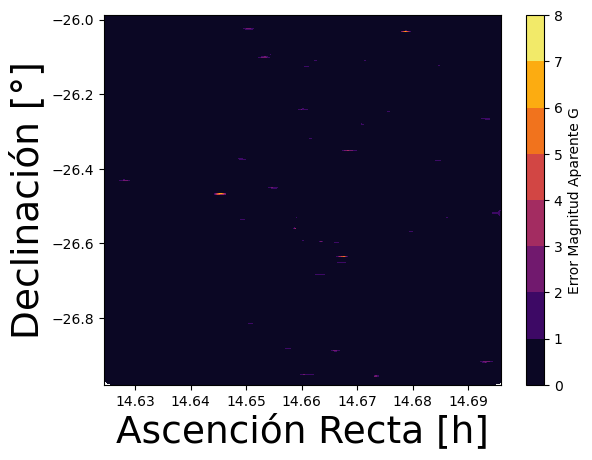

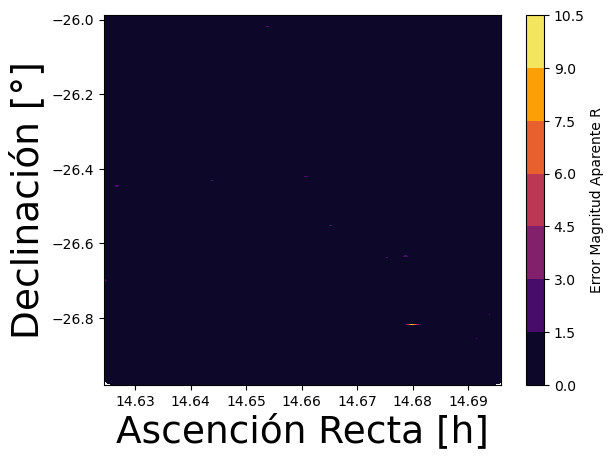

In [14]:
#graficamos el enrojecimiento, de donde podemos decir que el centro aproximado del cúmulo 
#globular presenta un enrojecimiento mediano con respecto a los extremos máximos y 
#mínimos del espectro (al igual que la extinción).
import matplotlib.pyplot as plt
import numpy as np
print('ahora el gráfico del enrojecimiento versus las coordenadas: ')

#podemos además, hacer un gráfico 3d pero en contorno, más que en color map:
plt.tricontourf(RA, DEC, ENROJ, cmap='viridis')
plt.xlabel('Ascención Recta [h]', fontsize=27)
plt.ylabel('Declinación [°]', fontsize=27)
plt.title('Enrojecimiento [magnitudes]', fontsize=27)
plt.colorbar()
plt.show()

#Ahora recordamos lo que es el reddening
#Reddening is the phenomena of the color of a visible astronomical object 
#(e.g., star) appearing more red from a distance than from nearby. Within 
#the visible wavelength range, the absorption of a given distance through 
#interstellar medium (ISM) rises with frequency, absorbing more of the blue 
#light than red. 

#The red light is also undergoing absorption, so reddening is 
#a hint that the objects are generally dimmer than they otherwise would be, 
#and the term reddening is often used to mean this overall dimming effect.

#Where reddening is observed, lower-luminosity objects such as red dwarfs may
#be obscured entirely, which is termed extinction. Measurements of the amount
#of reddening reveal information regarding the dust (e.g., how much) along 
#the line-of-sight, one measure being color excess (EB-V, a particular color 
#index), defined as: E(B-V) = A(B)-A(V) where A(V) = V - V0 and A(B) = B - B0
#and B and V are the observed intensities in the B and V passbands.
#B0 and V0 are those that would be observed if there were no reddening.

#Graficamos la extinción
#podemos además, hacer un gráfico 3d pero en contorno, más que en color map,
#reflexionando en esto, no es necesario hacer las correcciones a las magnitudes aparentes 
#debido a la extinción y/o reddening, debido a que a lo más hay un 25% de cambio en las mismas,
#que no cambian necesariamente ni absolutamente la forma de la secuencia principal 
#compuesta de estrellas del cúmulo principal.
print('ahora el gráfico de extinción versus las coordenadas: ')
plt.tricontourf(RA, DEC, EXT_G, cmap='gnuplot')
plt.xlabel('Ascención Recta [h]', fontsize=27)
plt.ylabel('Declinación [°]', fontsize=27)
plt.title('Extinción G [magnitudes]', fontsize=27)
plt.colorbar()
plt.show()

plt.tricontourf(RA, DEC, EXT_R, cmap='gnuplot')
plt.xlabel('Ascención Recta [h]', fontsize=27)
plt.ylabel('Declinación [°]', fontsize=27)
plt.title('Extinción R [magnitudes]', fontsize=27)
plt.colorbar()
plt.show()

#Recordemos algo que nos dice la IA acerca de la extinción:
#In astronomy, the extinction parameter is a measure of the amount of extinction, 
#or reduction in the intensity of light, that an object experiences as it travels 
#through the interstellar medium. The higher the value of the extinction parameter, 
#the greater the reduction in the intensity of light that the object experiences.

#When the extinction parameter has a high value, this means that the object is 
#located behind a large amount of dust and gas that absorbs and scatters a significant
#amount of the light that reaches it, making it appear dimmer than it actually is. 
#This makes it difficult to observe and study the object, as it is harder to detect 
#and measure its properties.

#On the other hand, when the extinction parameter has a low value, this means that 
#the object is located in a region with less dust and gas and thus experiences less
#extinction, making it appear brighter than it would otherwise. This makes it easier 
#to observe and study the object, as it is easier to detect and measure its properties.

#It's important to note that the extinction parameter can vary depending on the 
#wavelength of the light being observed, this is known as wavelength dependent extinction, 
#and it is caused by the different properties of the dust and gas in the interstellar medium. 
#The extinction is usually higher in the ultraviolet and blue regions of the spectrum than 
#in the infrared and red regions, this effect is known as the reddening effect.

#Additionally, it's worth noting that the extinction parameter can vary depending on 
#the position of the object in the sky, this is known as the variation of the extinction 
#along the line of sight. This variation can be caused by the presence of different 
#clouds of dust and gas at different distances from the observer.


#Graficaremos ahora la distribución de la magnitud g y r, que corresponden
#a la columna 3 y 5 respectivamente de los datos en excel
#podemos además, hacer un gráfico 3d pero en contorno, más que en color map:
print('ahora los gráficos de las magnitudes g y r versus las coordenadas: ')
plt.tricontourf(RA, DEC, MAG_G, cmap='plasma')
plt.xlabel('Ascención Recta [h]', fontsize=27)
plt.ylabel('Declinación [°]', fontsize=27)
plt.colorbar(label='Magnitud Aparente G')
plt.show()

plt.tricontourf(RA, DEC, MAG_R, cmap='winter')
plt.xlabel('Ascención Recta [h]', fontsize=27)
plt.ylabel('Declinación [°]', fontsize=27)
plt.colorbar(label='Magnitud Aparente R')
plt.show()

print('ahora los gráficos de chi y sharp versus las coordenadas: ')
indices5 = []
indices6 = []
for i in range(0,len(CHI)):
    if CHI[i]>-30:
        indices5 += [i]
    if SHARP[i]>-10:
        indices6 += [i]
indices6 = np.array(indices6)
indices5 = np.array(indices5)
plt.tricontourf(RA[indices5], DEC[indices5], CHI[indices5], cmap='cool')
plt.xlabel('Ascención Recta [h]', fontsize=27)
plt.ylabel('Declinación [°]', fontsize=27)
plt.colorbar(label='Chi')
plt.show()

plt.tricontourf(RA, DEC, RADIO, cmap='inferno')
plt.xlabel('Ascención Recta [h]', fontsize=27)
plt.ylabel('Declinación [°]', fontsize=27)
plt.colorbar(label='Radio [arcmin]')
plt.show()

n=10
plt.tricontourf(RA[indices6], DEC[indices6], SHARP[indices6], cmap='inferno')
plt.xlabel('Ascención Recta [h]', fontsize=27)
plt.ylabel('Declinación [°]', fontsize=27)
plt.colorbar(label='Sharp')
plt.show()

plt.tricontourf(RA, DEC, ERR_G, cmap='inferno')
plt.xlabel('Ascención Recta [h]', fontsize=27)
plt.ylabel('Declinación [°]', fontsize=27)
plt.colorbar(label='Error Magnitud Aparente G')
plt.show()

plt.tricontourf(RA, DEC, ERR_R, cmap='inferno')
plt.xlabel('Ascención Recta [h]', fontsize=27)
plt.ylabel('Declinación [°]', fontsize=27)
plt.colorbar(label='Error Magnitud Aparente R')
plt.show()

29150  es la cantidad de puntos tomados como parte del cúmulo


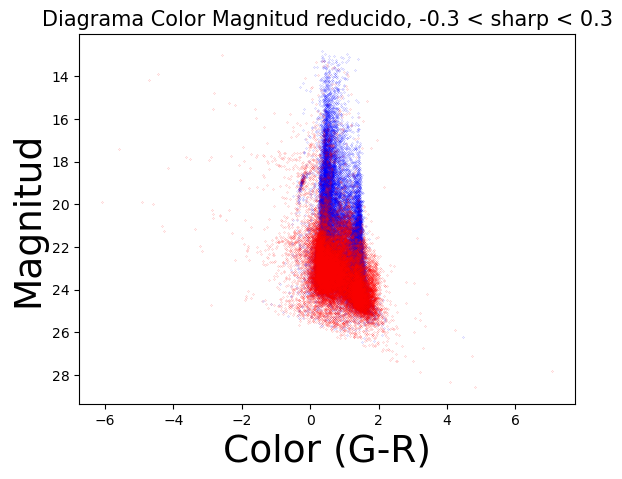

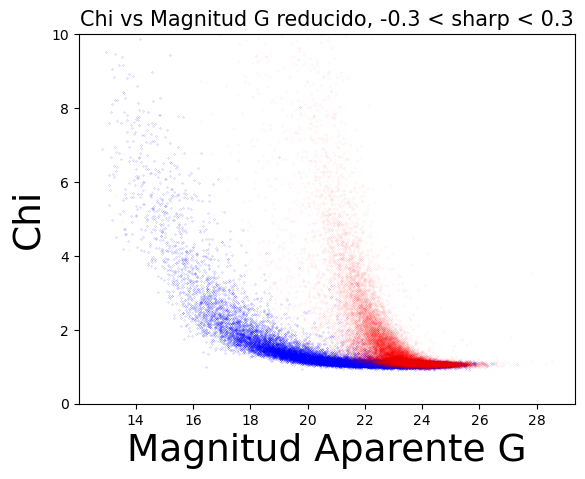

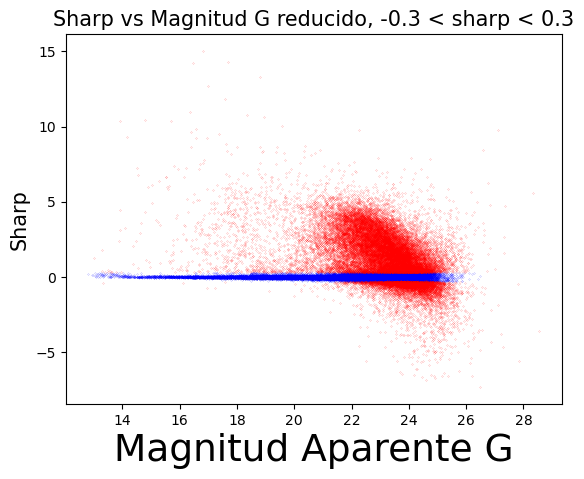

In [15]:
#Ahora hacemos el mismo procecdimiento que antes pero quitando datos de sharp y luego de chi.
def sharp_chi(limiteinferior, limitesuperior):
    lista = []
    Indice = MAG_G-MAG_R
    Magnitud = MAG_G
    magnitud = []
    indice = []
    indices = []
    indices_fuera = []
    for i in range(1,len(MAG_G)):
        if SHARP[i]< limitesuperior and SHARP[i]>limiteinferior:
            magnitud += [Magnitud[i]]
            indice += [Indice[i]]
            indices += [i]
        else:
            indices_fuera += [i]
    print(len(indices),' es la cantidad de puntos tomados como parte del cúmulo')
    fig = plt.figure()
    ax = fig.add_subplot(111)
    plt.scatter(np.array(indice), np.array(magnitud) , s=0.01, color='blue')
    #ahora graficamos los puntos que quedan fuera 
    plt.scatter(Indice[indices_fuera], Magnitud[indices_fuera], s=0.01, color='red')
    plt.title('Diagrama Color Magnitud reducido, '+str(limiteinferior)+' < sharp < '+str(limitesuperior) , fontsize=15)
    plt.xlabel('Color (G-R)', fontsize=27)
    ax.invert_yaxis()
    plt.ylabel('Magnitud', fontsize=27)
    #plt.xlim(-1,2)
    #plt.ylim(-27, -13)
    plt.show()

    fig1 = plt.figure()
    ax1 = fig1.add_subplot(111)
    plt.scatter(MAG_G[indices], CHI[indices] , s=0.01, color='blue')
    #ahora graficamos los puntos que quedan fuera
    plt.scatter(MAG_G[indices_fuera], CHI[indices_fuera] , s=0.001, color='red')
    plt.title('Chi vs Magnitud G reducido, '+str(limiteinferior)+' < sharp < '+str(limitesuperior) , fontsize=15)
    plt.ylabel('Chi', fontsize=27)
    plt.xlabel('Magnitud Aparente G', fontsize=27)
    plt.ylim(0, 10)
    plt.show()
    #Ahora queremos 
    
    fig2 = plt.figure()
    ax2 = fig2.add_subplot(111)
    plt.scatter(MAG_G[indices], SHARP[indices] , s=0.01, color='blue')
    #ahora graficamos los puntos que quedan fuera
    plt.scatter(MAG_G[indices_fuera], SHARP[indices_fuera] , s=0.01, color='red')
    plt.title('Sharp vs Magnitud G reducido, '+str(limiteinferior)+' < sharp < '+str(limitesuperior) , fontsize=15)
    plt.ylabel('Sharp', fontsize=15)
    plt.xlabel('Magnitud Aparente G', fontsize=27)
    plt.show()
    

sharp_chi(-.3,.3)

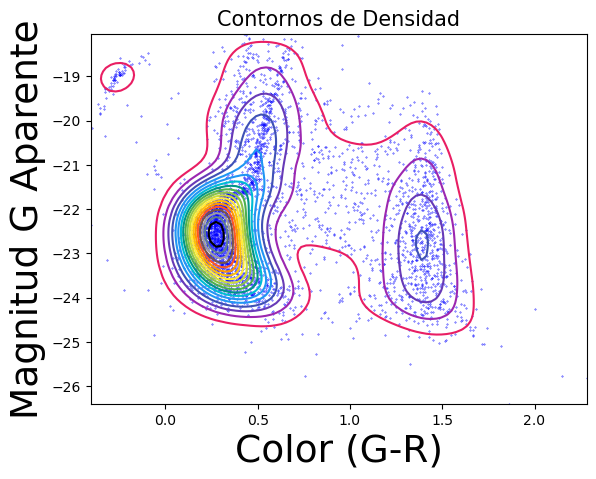

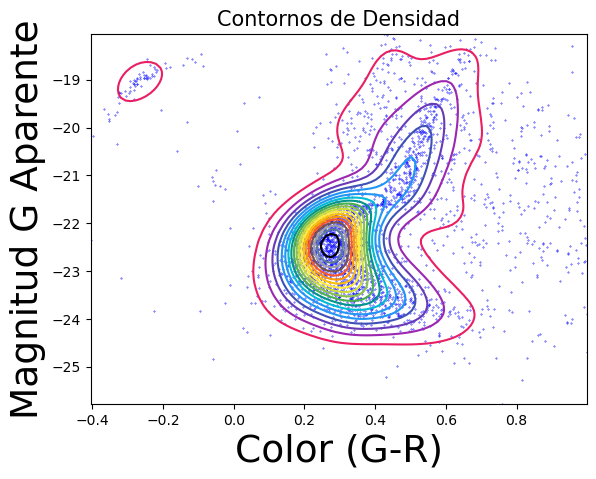

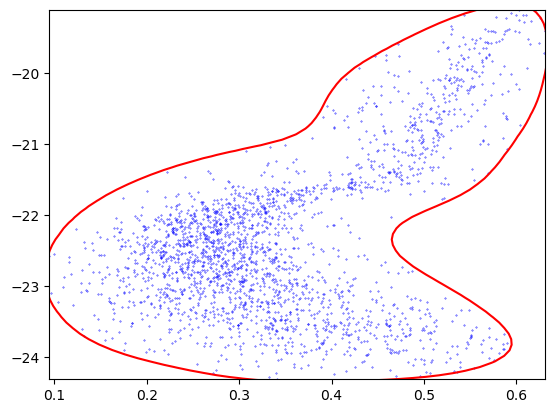

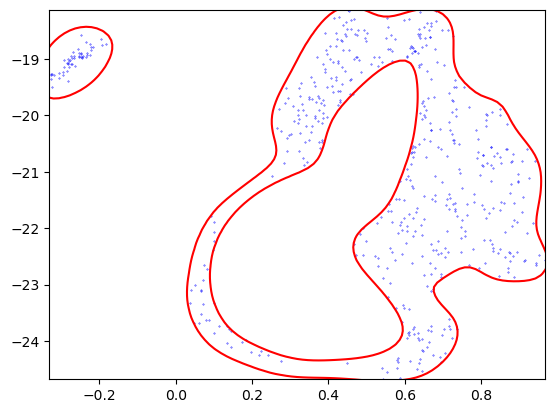

la cantidad de estrellas del cúmulo, es aproximadamente:  2370


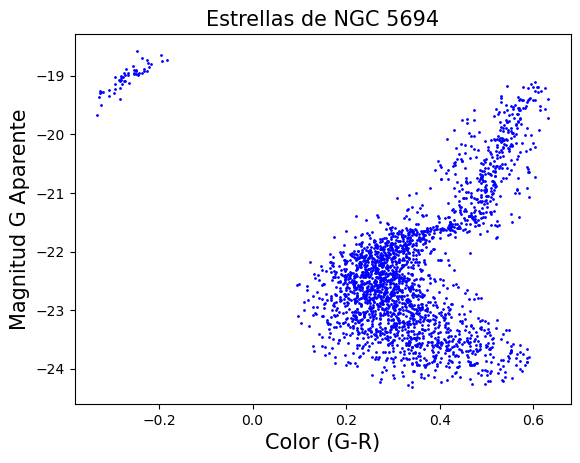

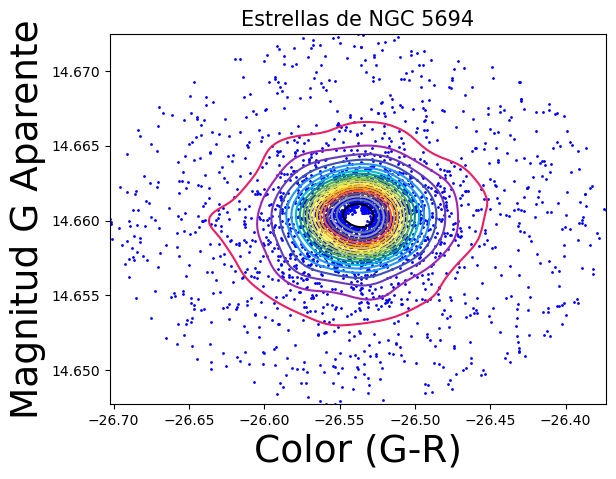

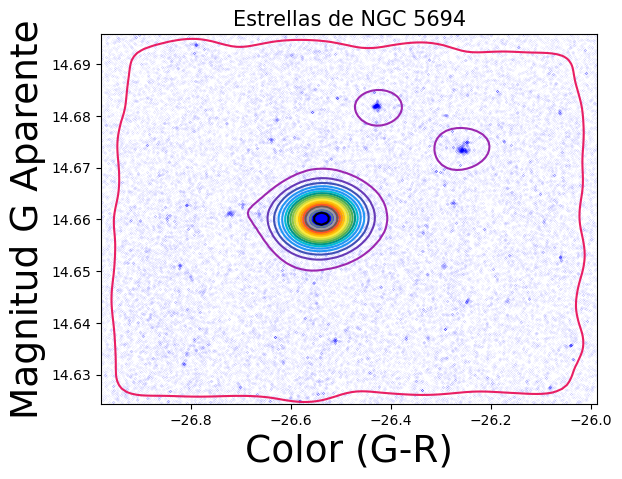

In [16]:
from scipy.stats import gaussian_kde
import matplotlib.pyplot as plt

colors1 = ["#F44336", "#E91E63", "#9C27B0", "#673AB7", "#3F51B5", 
          "#2196F3", "#03A9F4", "#00BCD4", "#009688", "#4CAF50",
        "#8BC34A", "#CDDC39", "#FFEB3B", "#FFC107", "#FF9800", 
        "#FF5722", "#795548", "#9E9E9E", "#607D8B", "#000000",
        "#FFFFFF", "#C2185B", "#E64A19", "#5D4037", "#004D40", 
        "#33691E", "#827717", "#E65100", "#BF360C", "#3E2723",
        "lime", "fuchsia", "lawngreen", "crimson", "salmon", 
        "olive", "gold"]

arr0 = np.array((MAG_G-MAG_R)<1)
arr1 = [CHI < chi_critico]
arr2 = np.array([a < b for a, b in zip(SHARP, POLINOMIO_SUP)])
arr3 = np.array([a > b for a, b in zip(SHARP, POLINOMIO_INF)])
arr4 = [RADIO>0] 
arr5 = [RADIO<10]
#necesariamente, debemos agregar el criterio arr0
arr6 = arr1 & arr2 & arr3 & arr4 & arr5 & arr0
arr7 = arr6.tolist()
arr8 = arr1 & arr2 & arr3 & arr4 & arr5 
arr9 = arr8.tolist()







x11=(MAG_G-MAG_R)[tuple(arr9)]
y11=(-MAG_G)[tuple(arr9)]
kde = gaussian_kde(np.vstack([x11, y11]))

# Calcular los puntos de máxima densidad
x_max2, y_max2 = np.mgrid[x11.min():x11.max():100j, y11.min():y11.max():100j]
positions2 = np.vstack([x_max2.ravel(), y_max2.ravel()])
density2 = np.reshape(kde(positions2).T, x_max2.shape)

for i in np.arange(0.05, 1, 0.05):
    plt.contour(x_max2, y_max2, density2, levels=[density2.max()*i], colors=colors1[int(i/0.05)])
plt.scatter(x11, y11, s=0.1, color = 'blue')
plt.xlim(min(x11),max(x11))
plt.ylim(min(y11),max(y11))
plt.title('Contornos de Densidad', fontsize=15)
plt.ylabel('Magnitud G Aparente', fontsize=27)
plt.xlabel('Color (G-R)', fontsize=27)
plt.show()












# Crear una función de densidad kernel a partir de los puntos en el gráfico
x=(MAG_G-MAG_R)[tuple(arr7)]
y=(-MAG_G)[tuple(arr7)]
kde = gaussian_kde(np.vstack([x, y]))


# Calcular los puntos de máxima densidad
x_max1, y_max1 = np.mgrid[x.min():x.max():100j, y.min():y.max():100j]
positions1 = np.vstack([x_max1.ravel(), y_max1.ravel()])
density1 = np.reshape(kde(positions1).T, x_max1.shape)

for i in np.arange(0.05, 1, 0.05):
    plt.contour(x_max1, y_max1, density1, levels=[density1.max()*i], colors=colors1[int(i/0.05)])
plt.scatter(x, y, s=0.1, color = 'blue')
plt.xlim(min(x),max(x))
plt.ylim(min(y),max(y))
plt.title('Contornos de Densidad', fontsize=15)
plt.ylabel('Magnitud G Aparente', fontsize=27)
plt.xlabel('Color (G-R)', fontsize=27)
plt.show()













xx = x
yy = y
positions = np.vstack([xx, yy])

# Crear un kernel de densidad
kde = gaussian_kde(positions)

# Evaluar el kernel en una malla
x_eval = np.linspace(x.min(), x.max(), 100)
y_eval = np.linspace(y.min(), y.max(), 100)
x_max, y_max = np.meshgrid(x_eval, y_eval)
density = kde(positions)

# Crear una máscara para seleccionar los puntos dentro de la "isocrona"
dens1 = 0.1
mask0 = density >= density.max()*dens1
x_points = xx[mask0]
y_points = yy[mask0]
plt.scatter(x_points, y_points, color='blue', s=0.1)
plt.contour(x_max1, y_max1, density1, levels=[density1.max()*dens1], colors='red')
plt.xlim(min(x_points),max(x_points))
plt.ylim(min(y_points),max(y_points))
plt.show()
#lo hemos logrado!






# Crear una máscara para datos de la rama horizontal
p_max = 0.1
p_min = 0.03
mask1 = density >= density.max()*p_min
mask2 = np.array(density < density.max()*p_max)
x_points1 = xx[mask1&mask2]
y_points1 = yy[mask1&mask2]

#en última instancia, son (x_points1[x_points1<0], ypoints1[x_points1<0]) solo de la rama horizontal la que nos interesa
plt.scatter(x_points1, y_points1, color='blue', s=0.1)
plt.contour(x_max1, y_max1, density1, levels=[density1.max()*p_max], colors='red')
plt.contour(x_max1, y_max1, density1, levels=[density1.max()*p_min], colors='red')
#plt.contour(x_max1, y_max1, density1, levels=[density1.max()*p_min], colors='red')
plt.xlim(min(x_points1),max(x_points1))
plt.ylim(min(y_points1),max(y_points1))
plt.show()
#lo hemos logrado!, en suma, (x_points1[x_points1<0], ypoints1[x_points1<0]) son la rama horizontal
#y por otro lado (x_points, y_points) son los puntos de la supuesta isocrona. Por ende, hemos de 
#concatenarlos, aunque es buena pregunta saber si en última instancia es bueno o no, tener los índices
#del arreglo original de tal concatenación.











color_cumulo = np.concatenate([x_points1[x_points1<0], x_points])
magnitud_cumulo = np.concatenate([y_points1[x_points1<0], y_points])
print('la cantidad de estrellas del cúmulo, es aproximadamente: ', len(color_cumulo))
plt.scatter(color_cumulo, magnitud_cumulo, s=1, color='blue')
ax.invert_yaxis()
plt.ylabel('Magnitud G Aparente', fontsize=15)
plt.xlabel('Color (G-R)', fontsize=15)
plt.title('Estrellas de NGC 5694', fontsize=15)
plt.show()




# Crear una función de densidad kernel a partir de los puntos en el gráfico
x2=DEC[tuple(arr7)]
y2=RA[tuple(arr7)]
kde = gaussian_kde(np.vstack([x2, y2]))


# Calcular los puntos de máxima densidad
x_max2, y_max2 = np.mgrid[x2.min():x2.max():100j, y2.min():y2.max():100j]
positions2 = np.vstack([x_max2.ravel(), y_max2.ravel()])
density2 = np.reshape(kde(positions2).T, x_max2.shape)

for i in np.arange(0.05, 1, 0.05):
    plt.contour(x_max2, y_max2, density2, levels=[density2.max()*i], colors=colors1[int(i/0.05)])
plt.scatter(x2, y2, s=1, color='blue')
plt.ylabel('Magnitud G Aparente', fontsize=27)
plt.xlabel('Color (G-R)', fontsize=27)
plt.title('Estrellas de NGC 5694', fontsize=15)
plt.show()
















x3=DEC
y3=RA
kde = gaussian_kde(np.vstack([x3, y3]))


# Calcular los puntos de máxima densidad
x_max3, y_max3 = np.mgrid[x3.min():x3.max():100j, y3.min():y3.max():100j]
positions3 = np.vstack([x_max3.ravel(), y_max3.ravel()])
density3 = np.reshape(kde(positions3).T, x_max3.shape)

for i in np.arange(0.05, 1, 0.05):
    plt.contour(x_max3, y_max3, density3, levels=[density3.max()*i], colors=colors1[int(i/0.05)])
plt.scatter(x3, y3, s=.001, color='blue')
plt.ylabel('Magnitud G Aparente', fontsize=27)
plt.xlabel('Color (G-R)', fontsize=27)
plt.title('Estrellas de NGC 5694', fontsize=15)
plt.show()



def hess_radio_contorno(rmin=0, rmax=10):
    arr0 = np.array((MAG_G-MAG_R)<1)
    arr1 = [CHI < chi_critico]
    arr2 = np.array([a < b for a, b in zip(SHARP, POLINOMIO_SUP)])
    arr3 = np.array([a > b for a, b in zip(SHARP, POLINOMIO_INF)])
    arr4 = [RADIO>rmin] 
    arr5 = [RADIO<rmax]
    #necesariamente, debemos agregar el criterio arr0
    arr6 = arr1 & arr2 & arr3 & arr4 & arr5 & arr0
    arr7 = arr6.tolist()
    
    x=(MAG_G-MAG_R)[tuple(arr7)]
    y=(-MAG_G)[tuple(arr7)]
    xx = x
    yy = y
    positions = np.vstack([xx, yy])
    density = kde(positions)
    p_max = 0.1
    p_min = 0.03
    mask1 = density >= density.max()*p_min
    mask2 = np.array(density < density.max()*p_max)
    x_points1 = xx[mask1&mask2]
    y_points1 = yy[mask1&mask2]
    
    
    color_cumulo = np.concatenate([x_points1[x_points1<0], x_points])
    magnitud_cumulo = np.concatenate([y_points1[x_points1<0], y_points])
    g = magnitud_cumulo#-MAG_G[tuple(arr7)] # Apparent Magnitude values
    g_r = color_cumulo#(MAG_G-MAG_R)[tuple(arr7)]   # g-r color index values
    ra = RA[tuple(arr7)] # Right Ascension values [°]
    dec = DEC[tuple(arr7)]*15  # Declination values
    
    
    # Define the bin edges for the Hess diagram
    g_bins = np.linspace(g.min(), g.max(), 200)
    g_r_bins = np.linspace(g_r.min(), g_r.max(), 200)
    ra_bins = np.linspace(ra.min(), ra.max(), 200)
    dec_bins = np.linspace(dec.min(), dec.max(), 200)

    # Create the 2D histogram using the numpy histogram2d function
    H, xedges, yedges = np.histogram2d(g_r, g, bins=(g_r_bins, g_bins))

    # Normalize the histogram by the bin area
    H = H / ((g_bins[1]-g_bins[0])*(g_r_bins[1]-g_r_bins[0])*((ra_bins[1]-ra_bins[0]))*((dec_bins[1]-dec_bins[0])))

    matrix=H.T
    mask = matrix != 0
    result = np.zeros(matrix.shape)
    result[mask] = np.log(matrix[mask])
    
    # Plot the Hess diagram using the imshow function from matplotlib
    plt.figure(figsize=(7,5))
    plt.imshow(result, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
           aspect='auto', cmap='inferno', vmin=0)
    
    plt.title('DCM radio entre '+str(round(rmin,3))+' y '+str(round(rmax,3))+' [arcmin]', fontsize=15)
    plt.ylim(-25,-18)
    plt.xlim(-0.4, 0.7)
    plt.ylabel('Magnitud g', fontsize=27)
    plt.xlabel('Color g-r', fontsize=27)

    #plt.xlim(0,1.8)
    #plt.ylim(-25,-18)
    plt.colorbar(label='Número de estrellas por 1 mag/0.1 color/1 grado cuadrado')
    plt.show()


    

In [17]:
#Ahora queremos simplemente obtener los datos que están en 
#la isocrona 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from statistics import mode
import glob

colors = np.array(["#F44336", "#E91E63", "#9C27B0", "#673AB7", "#3F51B5", 
                   "#2196F3", "#03A9F4", "#00BCD4", "#009688", "#4CAF50",
                   "#8BC34A", "#CDDC39", "#FFEB3B", "#FFC107", "#FF9800", 
                   "#FF5722", "#795548", "#9E9E9E", "#607D8B", "#000000",
                   "#FFFFFF", "#C2185B", "#E64A19", "#5D4037", "#004D40", 
                   "#33691E", "#827717", "#E65100", "#BF360C", "#3E2723",
                   "lime", "fuchsia", "lawngreen", "crimson", "salmon", 
                   "olive", "gold"])    
rmin = 0
rmax = 10
arr0, arr1 = np.array((MAG_G-MAG_R)<1), [CHI<chi_critico]
arr2 = np.array([a < b for a, b in zip(SHARP, POLINOMIO_SUP)])
arr3 = np.array([a > b for a, b in zip(SHARP, POLINOMIO_INF)])
arr4, arr5 = [RADIO > rmin], [RADIO < rmax]
arr6 = arr0 & arr1 & arr2 & arr3 & arr4 & arr5
arr7 = arr6.tolist()

#aquí notamos algo interesante: Y=0.23, E(B-V)=0.1, [Fe/H]=-1.65, (m-M)_v=17.82
#d = 26kpc tomados de Ortolani & Gratton (1989)
def CMD_isocrona_SSDS(arreglo, minimo, maximo):
    sin_repetir = []
    for jj in arreglo:
        df = pd.read_csv('isocrona_'+str(jj)+'.csv', delimiter=';', decimal=",")
        ISOCRONA = np.array(df)
        isocrona = np.array(ISOCRONA)
        print(isocrona[:,2][4])
        if isocrona[:,2][4] == "SDSS":
            r, g = isocrona[:,7], isocrona[:,6]
            cero, uno = isocrona[:,2], isocrona[:,1]
            cero_0 = isocrona[:,0] 
            k = [[isocrona[:,5][2], isocrona[:,2][2],
                  isocrona[:,6][2]]]
            if not(k in sin_repetir):  
                sin_repetir += k
                indices_cero , edad, largo = [],[],[]
                for i in range(0,len(cero)):
                    if cero[i]=="LogTeff":
                        indices_cero += [i+2]
                        if type(cero[i-1]) == str:
                            largo += [int(float(cero[i-1][5:]))]
                            x1 = uno[i-1]
                            edad += [float(x1.replace(',', '.'))]
                        else:
                            largo += [int(float(uno[i-1][5:]))]
                            x2 = cero_0[i-1][5:]
                            edad += [float(x2.replace(',', '.'))]
                indices_cero=np.array(indices_cero)
                largo=np.array(largo)
                indices_primeros = indices_cero
                indices_segundos = indices_cero + largo - 1
                T = MAG_G[tuple(arr7)] 
                COLOR = MAG_G-MAG_R
                color = (COLOR)[tuple(arr7)]   
                dis = 29100
                COLOR_ABSOLUTE = color - (EXT_G-EXT_R)[tuple(arr7)] + ENROJ[tuple(arr7)]#+ 0.3   #- 5*np.log10(dis/10) 
                G_ABSOLUTE = -T + 5*np.log10(dis/10) + EXT_G[tuple(arr7)]
                fig = plt.figure(figsize=(7, 5))
                ax = fig.add_subplot(111)
                plt.scatter(COLOR_ABSOLUTE, G_ABSOLUTE, s=3, color='blue',label='')
                for i in range(minimo, maximo): 
                    lst = g[indices_primeros[i]:indices_segundos[i]]
                    lst2 = r[indices_primeros[i]:indices_segundos[i]]
                    MAGNITUD_G = np.array([float(x.replace(',', '.')) for x in lst])
                    MAGNITUD_R = np.array([float(x.replace(',', '.')) for x in lst2])
                    color = MAGNITUD_G-MAGNITUD_R
                    magn = -MAGNITUD_G  
                        
                    # curve_values is a numpy array with fewer points
                    curve_values_x = color
                    # point_values is a numpy array with more points
                    point_values_x = COLOR_ABSOLUTE
                        
                    x_points = np.arange(len(point_values_x))
                    x_curve = np.linspace(0, len(point_values_x)-1, len(curve_values_x))
                    interpolated_color = np.interp(x_points, x_curve, curve_values_x)
                        
                    squared_differences = (interpolated_color - point_values_x) ** 2
                    mean_squared_differences = np.mean(squared_differences)
                    rmse = np.sqrt(mean_squared_differences)
                    print(rmse)
                        
                    #isocrona!
                    plt.plot(color, magn,color=colors[i], label=str(round(edad[i],2))+' [Gyr]')
                plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
                plt.title('Diagrama Color Magnitud, [Fe/H]='+ str(k[0][0])+', Y='+str(k[0][1])+
                          ', [a/Fe]='+str(k[0][2]), fontsize=15)
                plt.xlabel('Color (R-G)', fontsize=27)
                plt.ylabel('Magnitud Absoluta G', fontsize=27)
                #ax.invert_yaxis()
                plt.ylim(-8,0)
                plt.xlim(0,1.5)
                plt.show()
                
                
def CMD_isocrona_SSDS_REDUCCION(arreglo, minimo, maximo):
    sin_repetir = []
    for jj in arreglo:
        df = pd.read_csv('isocrona_'+str(jj)+'.csv', delimiter=';', decimal=",")
        ISOCRONA = np.array(df)
        isocrona = np.array(ISOCRONA)
        print(isocrona[:,2][4])
        if isocrona[:,2][4] == "SDSS":
            r, g = isocrona[:,7], isocrona[:,6]
            cero, uno = isocrona[:,2], isocrona[:,1]
            cero_0 = isocrona[:,0] 
            k = [[isocrona[:,5][2], isocrona[:,2][2],
                  isocrona[:,6][2]]]
            if not(k in sin_repetir):  
                sin_repetir += k
                indices_cero , edad, largo = [],[],[]
                for i in range(0,len(cero)):
                    if cero[i]=="LogTeff":
                        indices_cero += [i+2]
                        if type(cero[i-1]) == str:
                            largo += [int(float(cero[i-1][5:]))]
                            x1 = uno[i-1]
                            edad += [float(x1.replace(',', '.'))]
                        else:
                            largo += [int(float(uno[i-1][5:]))]
                            x2 = cero_0[i-1][5:]
                            edad += [float(x2.replace(',', '.'))]
                indices_cero=np.array(indices_cero)
                largo=np.array(largo)
                indices_primeros = indices_cero
                indices_segundos = indices_cero + largo - 1
                def isocrona(rmin, rmax, minim, maxim):
                    T = MAG_G[tuple(arr7)] 
                    color = (MAG_G-MAG_R)[tuple(arr7)] 
                    dis = 29100
                    COLOR_ABSOLUTE = color - (EXT_G-EXT_R)[tuple(arr7)] + ENROJ[tuple(arr7)] 
                    G_ABSOLUTE = -T + 5*np.log10(dis/10) + EXT_G[tuple(arr7)]
                    fig = plt.figure(figsize=(7, 5))
                    ax = fig.add_subplot(111)
                    
                    
                    
                    ############################################################################################################
                    x = COLOR_ABSOLUTE
                    y = G_ABSOLUTE
                    
                    xx = x
                    yy = y
                    positions = np.vstack([xx, yy])

                    # Crear un kernel de densidad
                    kde = gaussian_kde(positions)

                    # Evaluar el kernel en una malla
                    x_eval = np.linspace(x.min(), x.max(), 100)
                    y_eval = np.linspace(y.min(), y.max(), 100)
                    x_max, y_max = np.meshgrid(x_eval, y_eval)
                    density = kde(positions)

                    # Crear una máscara para seleccionar los puntos dentro del contorno de densidad del 0.5
                    dens1 = 0.1
                    mask = density >= density.max()*dens1
                    x_points = xx[mask]
                    y_points = yy[mask]
                    
                    
                    
                    p_max = 0.1
                    p_min = 0.03
                    mask1 = density >= density.max()*p_min
                    mask2 = np.array(density < density.max()*p_max)
                    x_points1 = xx[mask1&mask2]
                    y_points1 = yy[mask1&mask2]
                    
                    
                    limite = .5
                    color_cumulo = np.concatenate([x_points1[x_points1<limite], x_points])
                    magnitud_cumulo = np.concatenate([y_points1[x_points1<limite], y_points])
                    print('la cantidad de estrellas del cúmulo, es aproximadamente ', len(color_cumulo))
                    plt.scatter(color_cumulo, magnitud_cumulo, s=1, color='blue')
                    ############################################################################################################
                    #plt.scatter(COLOR_ABSOLUTE, G_ABSOLUTE, s=3, 
                    #            color='blue',label='')
                    for i in range(minim, maxim): 
                        lst = g[indices_primeros[i]:indices_segundos[i]]
                        lst2 = r[indices_primeros[i]:indices_segundos[i]]
                        MAGNITUD_G = np.array([float(x.replace(',', '.')) for x in lst])
                        MAGNITUD_R = np.array([float(x.replace(',', '.')) for x in lst2])
                        color = MAGNITUD_G-MAGNITUD_R
                        magn = -MAGNITUD_G  
                        
                        # ahora calculamos la diferencia en color de los puntos y la isocrona
                        # curve_values es un arreglo con menos puntos
                        curve_values_x3 = color
                        # point_values es un arreglo con más puntos
                        point_values_x3 = color_cumulo
                        
                        x_points3 = np.arange(len(point_values_x3))
                        x_curve3 = np.linspace(0, len(point_values_x3)-1, len(curve_values_x3))
                        interpolated_color3 = np.interp(x_points3, x_curve3, curve_values_x3)
                        
                        squared_difference3 = (interpolated_color3 - point_values_x3) ** 2
                        mean_squared_differences3 = np.mean(squared_difference3)
                        rmse3 = np.sqrt(mean_squared_differences3)
                        print('la desviación RMS es: ',rmse3)

                        #isocrona!
                        plt.plot(color, magn,color='red', label=str(round(edad[i],2))+' [Gyr]')
                    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
                    plt.title('Diagrama Color Magnitud, [Fe/H]='+ str(k[0][0])+', Y='+str(k[0][1])+
                              ', [a/Fe]='+str(k[0][2]), fontsize=15)
                    plt.xlabel('Color (R-G)', fontsize=27)
                    plt.ylabel('Magnitud Absoluta G', fontsize=27)
                    plt.ylim(min(magnitud_cumulo), max(magnitud_cumulo))
                    plt.xlim(min(color_cumulo), max(color_cumulo))
                    plt.show()
                isocrona(rmin, rmax, minimo, maximo)
                
def CMD_isocrona_SSDS_CONTORNO(arreglo, minimo, maximo):
    sin_repetir = []
    for jj in arreglo:
        df = pd.read_csv('isocrona_'+str(jj)+'.csv', delimiter=';', decimal=",")
        ISOCRONA = np.array(df)
        isocrona = np.array(ISOCRONA)
        print(isocrona[:,2][4])
        if isocrona[:,2][4] == "SDSS":
            r, g = isocrona[:,7], isocrona[:,6]
            cero, uno = isocrona[:,2], isocrona[:,1]
            cero_0 = isocrona[:,0] 
            k = [[isocrona[:,5][2], isocrona[:,2][2],
                  isocrona[:,6][2]]]
            if not(k in sin_repetir):  
                sin_repetir += k
                indices_cero , edad, largo = [],[],[]
                for i in range(0,len(cero)):
                    if cero[i]=="LogTeff":
                        indices_cero += [i+2]
                        if type(cero[i-1]) == str:
                            largo += [int(float(cero[i-1][5:]))]
                            x1 = uno[i-1]
                            edad += [float(x1.replace(',', '.'))]
                        else:
                            largo += [int(float(uno[i-1][5:]))]
                            x2 = cero_0[i-1][5:]
                            edad += [float(x2.replace(',', '.'))]
                indices_cero=np.array(indices_cero)
                largo=np.array(largo)
                indices_primeros = indices_cero
                indices_segundos = indices_cero + largo - 1
                def isocrona(rmin, rmax, minim, maxim):
                    T = MAG_G[tuple(arr7)] 
                    color = (MAG_G-MAG_R)[tuple(arr7)] 
                    dis = 29100
                    COLOR_ABSOLUTE = color - (EXT_G-EXT_R)[tuple(arr7)] + ENROJ[tuple(arr7)] 
                    G_ABSOLUTE = -T + 5*np.log10(dis/10) + EXT_G[tuple(arr7)]
                    fig = plt.figure(figsize=(7, 5))
                    ax = fig.add_subplot(111)
                    ############################################################################################################
                    x = COLOR_ABSOLUTE
                    y = G_ABSOLUTE
                    
                    xx = x
                    yy = y
                    positions = np.vstack([xx, yy])

                    # Crear un kernel de densidad
                    kde = gaussian_kde(positions)

                    # Evaluar el kernel en una malla
                    x_eval = np.linspace(x.min(), x.max(), 100)
                    y_eval = np.linspace(y.min(), y.max(), 100)
                    x_max, y_max = np.meshgrid(x_eval, y_eval)
                    density = kde(positions)

                    # Crear una máscara para seleccionar los puntos dentro del contorno de densidad del 0.5
                    dens1 = 0.1
                    mask = density >= density.max()*dens1
                    x_points = xx[mask]
                    y_points = yy[mask]
                    
                    
                    
                    p_max = 0.1
                    p_min = 0.03
                    mask1 = density >= density.max()*p_min
                    mask2 = np.array(density < density.max()*p_max)
                    x_points1 = xx[mask1&mask2]
                    y_points1 = yy[mask1&mask2]
                    
                    x_max1, y_max1 = np.mgrid[x.min():x.max():100j, y.min():y.max():100j]
                    positions1 = np.vstack([x_max1.ravel(), y_max1.ravel()])
                    density1 = np.reshape(kde(positions1).T, x_max1.shape)
                    
                    limite = .5
                    color_cumulo = np.concatenate([x_points1[x_points1<limite], x_points])
                    magnitud_cumulo = np.concatenate([y_points1[x_points1<limite], y_points])
                    print('la cantidad de estrellas del cúmulo, es aproximadamente ', len(color_cumulo))
                    
                    
                    
                    
                    
                    
                    plt.contour(x_max1, y_max1, density1, levels=[density1.max()*p_min], colors='red', 
                                extent=[min(x_points1[x_points1<limite]), max(x_points1[x_points1<limite]), 
                                        min(y_points1[x_points1<limite]), max(y_points1[x_points1<limite])])
                    plt.contour(x_max1, y_max1, density1, levels=[density1.max()*dens1], colors='red')
                    plt.scatter(color_cumulo, magnitud_cumulo, s=1, color='blue')
                    
                    
                    
                    
                    ############################################################################################################
                    #plt.scatter(COLOR_ABSOLUTE, G_ABSOLUTE, s=3, 
                    #            color='blue',label='')
                    for i in range(minim, maxim): 
                        lst = g[indices_primeros[i]:indices_segundos[i]]
                        lst2 = r[indices_primeros[i]:indices_segundos[i]]
                        MAGNITUD_G = np.array([float(x.replace(',', '.')) for x in lst])
                        MAGNITUD_R = np.array([float(x.replace(',', '.')) for x in lst2])
                        color = MAGNITUD_G-MAGNITUD_R
                        magn = -MAGNITUD_G  
                        
                        # ahora calculamos la diferencia en color de los puntos y la isocrona
                        # curve_values es un arreglo con menos puntos
                        curve_values_x3 = color
                        # point_values es un arreglo con más puntos
                        point_values_x3 = color_cumulo
                        
                        x_points3 = np.arange(len(point_values_x3))
                        x_curve3 = np.linspace(0, len(point_values_x3)-1, len(curve_values_x3))
                        interpolated_color3 = np.interp(x_points3, x_curve3, curve_values_x3)
                        
                        squared_difference3 = (interpolated_color3 - point_values_x3) ** 2
                        mean_squared_differences3 = np.mean(squared_difference3)
                        rmse3 = np.sqrt(mean_squared_differences3)
                        print('la desviación RMS es: ',rmse3)

                        #isocrona!
                        plt.plot(color, magn,color=colors[i], label=str(round(edad[i],2))+' [Gyr]')
                    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
                    plt.title('Diagrama Color Magnitud, [Fe/H]='+ str(k[0][0])+', Y='+str(k[0][1])+
                              ', [a/Fe]='+str(k[0][2]), fontsize=15)
                    plt.xlabel('Color (R-G)', fontsize=27)
                    plt.ylabel('Magnitud Absoluta G', fontsize=27)
                    plt.ylim(min(magnitud_cumulo), max(magnitud_cumulo))
                    plt.xlim(min(color_cumulo), max(color_cumulo))
                    plt.show()
                isocrona(rmin, rmax, minimo, maximo)
                
minimo = 34
maximo = 35
files = glob.glob('isocrona_*')
n = len(files)
Arreglo = []

for i in range(1,n+1):
    Arreglo += [i]
print(Arreglo)


[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]


SDSS
0.6423557232277035
0.6557224614797516
0.6664071557304571
0.6591383672458709
0.6672557245541919
0.6739067090308306
0.6844579706183757
0.6929828911800786
0.6857187775027539
0.6920474281782525


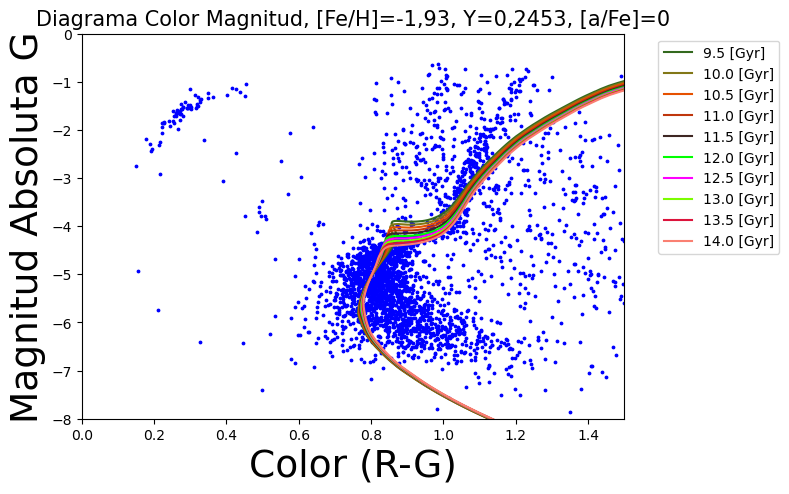

SDSS
0.633296650164746
0.6464110964494537
0.6568784697317521
0.6493036261856839
0.6573156513090301
0.6638522876763737
0.6744747510464537
0.6827175107056767
0.6752284600406867
0.6814804659563927


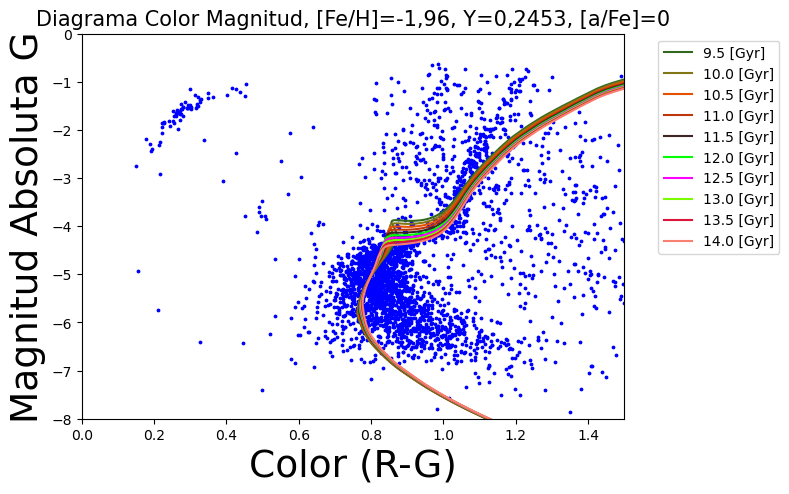

SDSS
0.6039625907740402
0.6118882100548672
0.612462536821376
0.6200519236196267
0.6274231741353542
0.6346836218764437
0.6416762605391962
0.6373054347851708
0.6436213919897475
0.6505996938922343


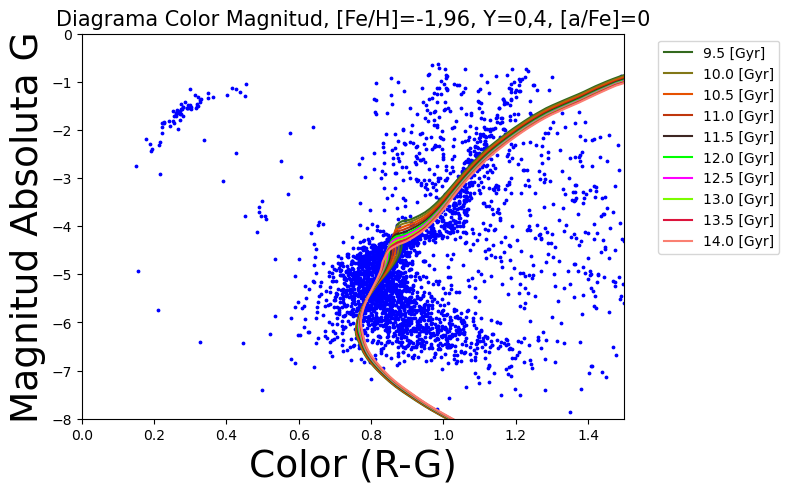

SDSS
0.6126166046676269
0.6195819448073647
0.6272835299501544
0.6223342278745464
0.6343257719141212
0.641379368693163
0.6519691773439048
0.6589106426857616
0.6657832685861131
0.6602336571151035


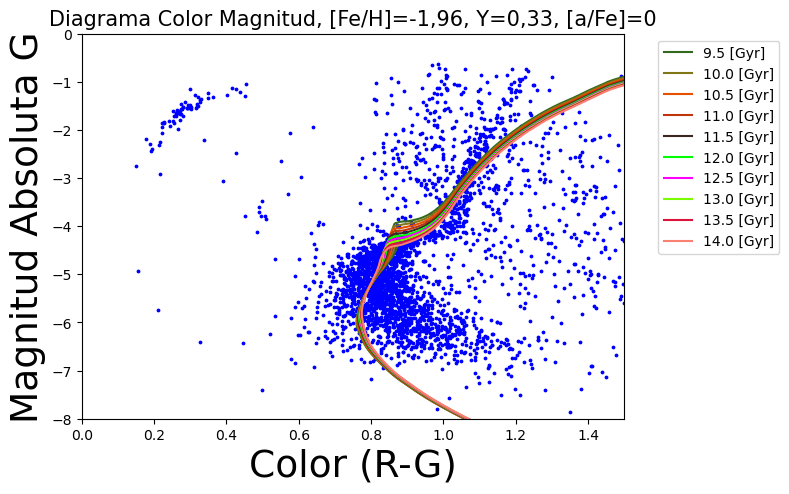

SDSS
0.6159300940767246
0.6085204751766078
0.6181714312553658
0.6252924882277914
0.6323638781173566
0.6395524265132908
0.6353302603219969
0.6418889664107921
0.6485505216485417
0.6551690529220594


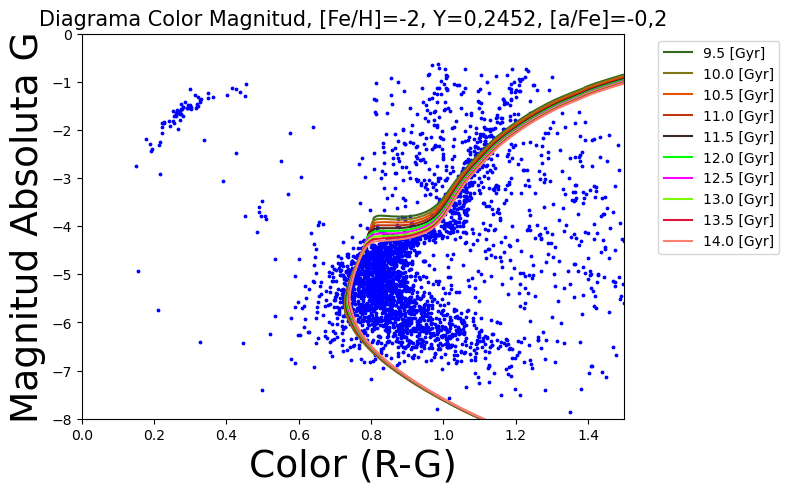

SDSS
0.576454965583635
0.5884412132598104
0.5982520060913706
0.5884548308762441
0.5957104341859902
0.6020653340379812
0.6121362212291392
0.6194366135918509
0.6097672307239144
0.6157428094614219


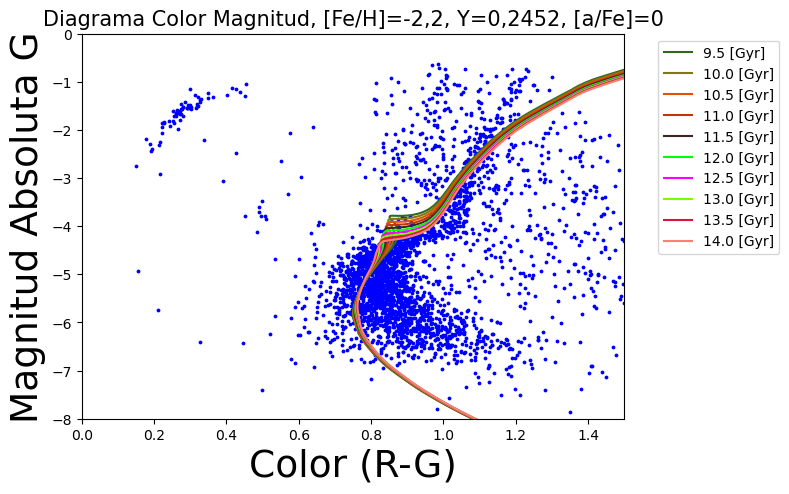

SDSS
0.6215828173880488
0.6343762019104051
0.6445668092166903
0.6365904268294811
0.6444866006674396
0.650854023265502
0.661561898977006
0.669442109974832
0.6616470156828216
0.6678071763103244


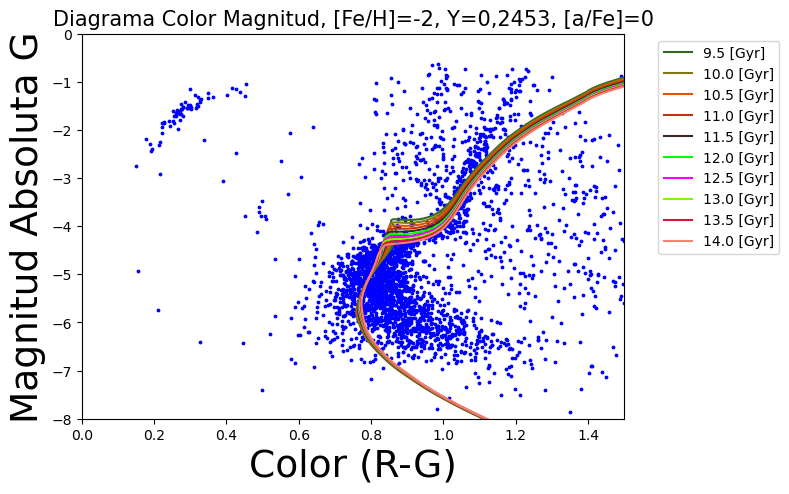

SDSS
0.6637320256686887
0.6610579085427787
0.6691417007817488
0.6807095216197147
0.6887553778714085
0.6955839272498265
0.6924317949183902
0.6980631349772681
0.7072221921684109
0.7127329502641896


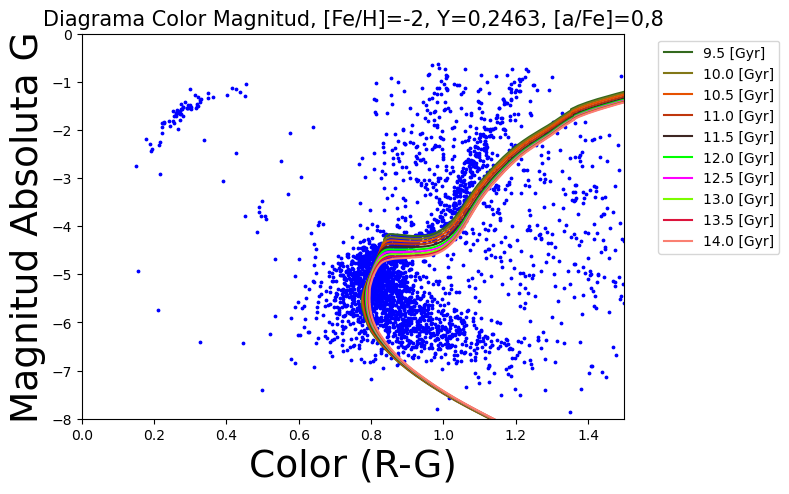

SDSS
0.6203930877155431
0.6209734031266788
0.6282467149511096
0.6354501726599491
0.6425626532113972
0.6388929793263526
0.6496317477035323
0.6562264599287627
0.6627442536585305
0.6691574426241966


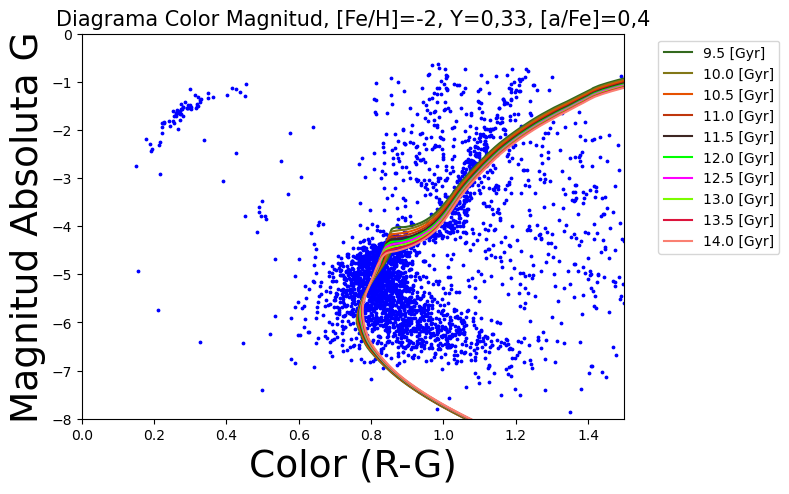

SDSS
12.09597013383791
12.102133307102903
12.184909813504746
12.26862467959149
12.351961789714395
12.327916018771802
12.439715361251936
12.478085679624117
12.558220993519443
12.62315967089616


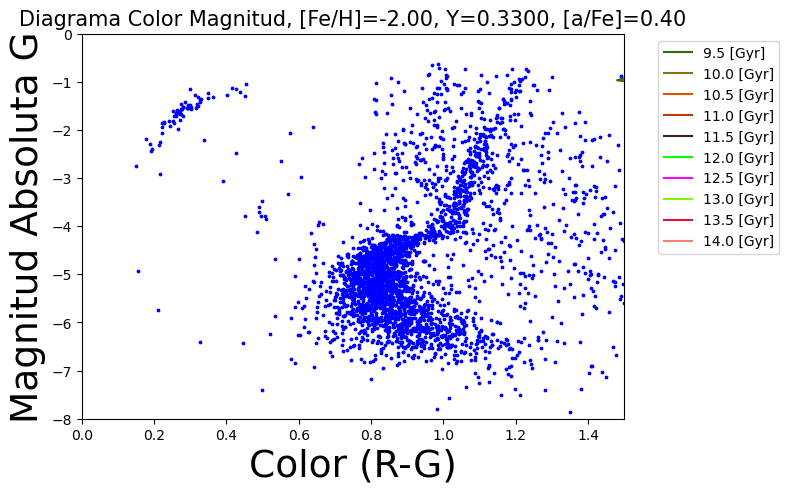

SDSS
11.997179192479658
11.947013353835603
12.006899934821455
12.096260599152576
12.186483724730454
12.277127378785625
12.244324362815295
12.32960339730165
12.414899412228978
12.472207258286167


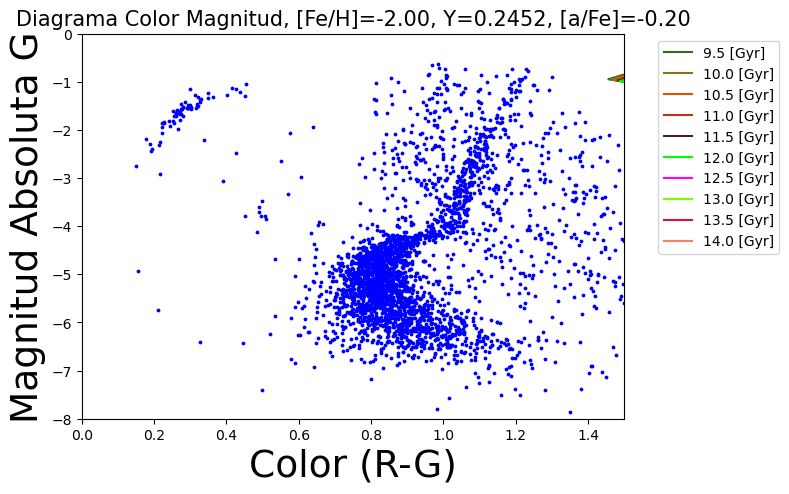

SDSS
0.6203930877155431
0.6209734031266788
0.6282467149511096
0.6354501726599491
0.6425626532113972
0.6388929793263526
0.6496317477035323
0.6562264599287627
0.6627442536585305
0.6691574426241966


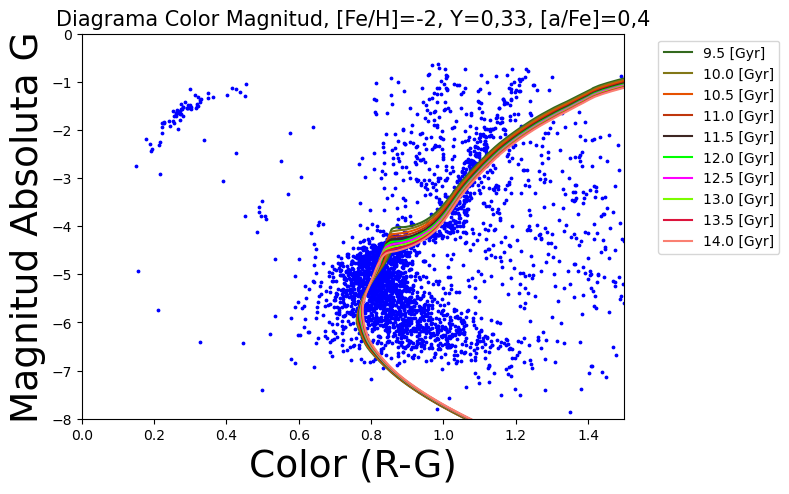

SDSS
0.6159300940767246
0.6085204751766078
0.6181714312553658
0.6252924882277914
0.6323638781173566
0.6395524265132908
0.6353302603219969
0.6418889664107921
0.6485505216485417
0.6551690529220594


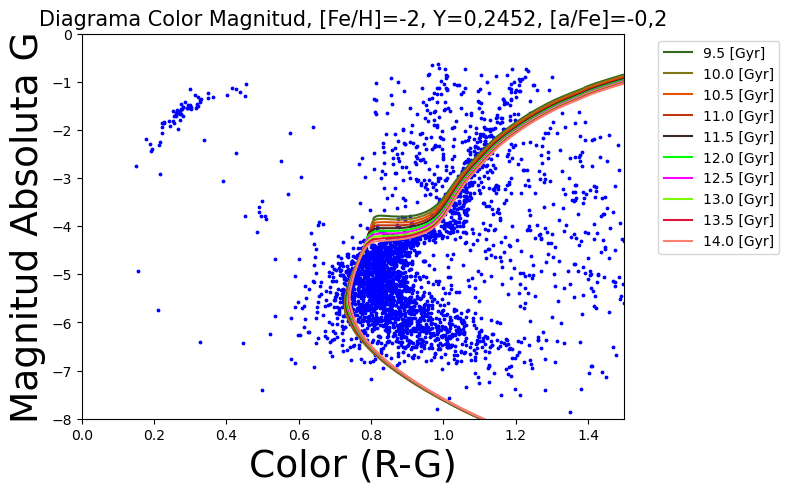

SDSS
0.6215828173880488
0.6343762019104051
0.6445668092166903
0.6365904268294811
0.6444866006674396
0.650854023265502
0.661561898977006
0.669442109974832
0.6616470156828216
0.6678071763103244


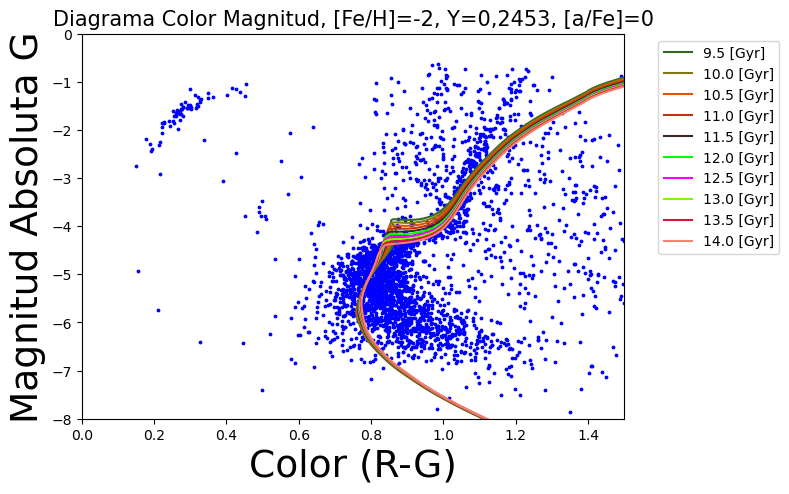

SDSS
0.7383245894073063
0.7545682538799869
0.7673329105282592
0.7629452848891006
0.7719129335694993
0.7801316681715537
0.7895452747803274
0.8009491122834571
0.7957458979587858
0.8027974424509385


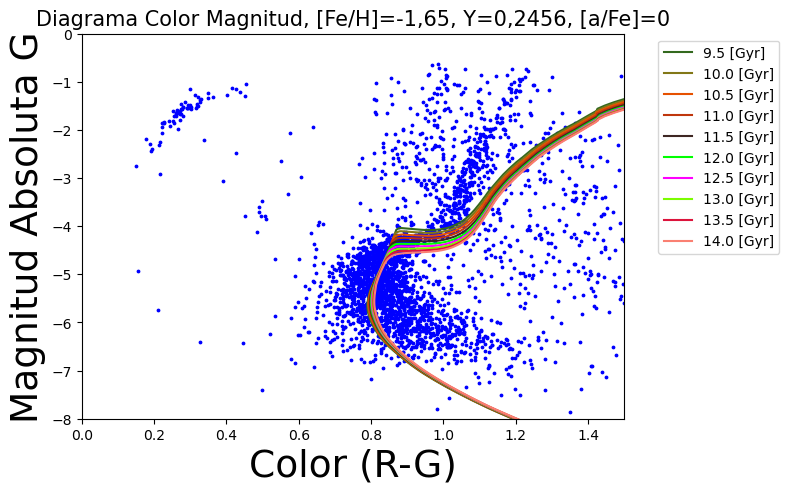

SDSS
0.5330178711011235
0.5442365838338661
0.5537224260101853
0.5419577784923557
0.5486258548733162
0.5550201445239654
0.5645097723948393
0.5712818969841824
0.5595739638394152
0.5654168094118156


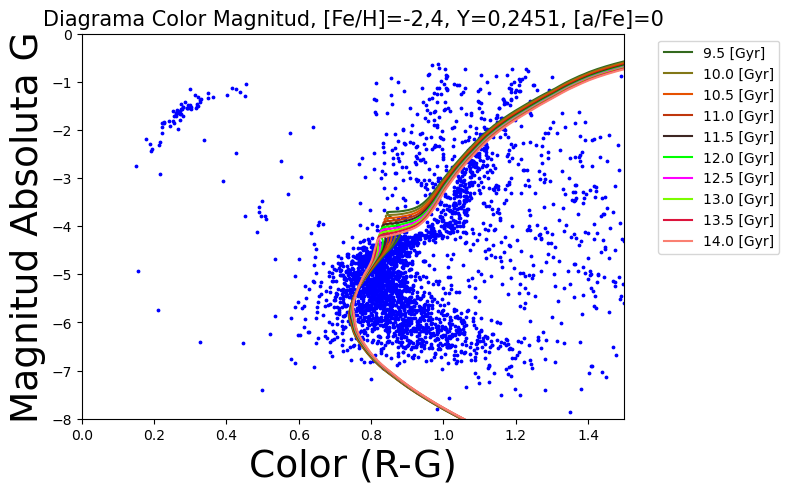

SDSS
0.6852160820795727
0.6834732081012312
0.691496916427196
0.7033190764201794
0.7115577443822058
0.7185797806448455
0.7163453239306883
0.7219752967520484
0.7313250388750293
0.7370119198735957


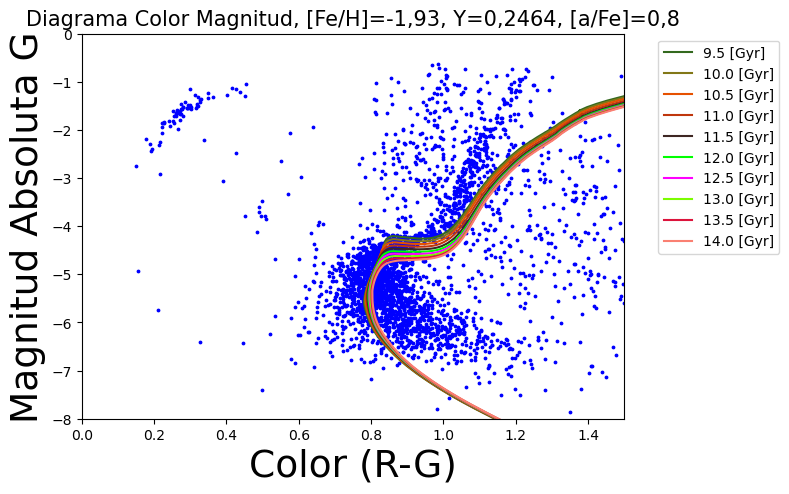

SDSS
0.6291934463486802
0.6223411499901126
0.6321682562241278
0.6393361675616986
0.6464383711035454
0.6537411624793267
0.6499495361706394
0.6571555684202819
0.6640399672319752
0.6708023460598191


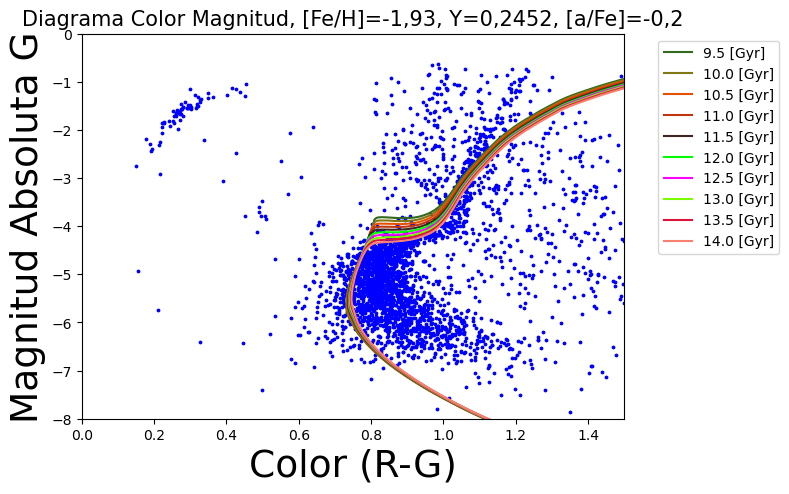

In [18]:
CMD_isocrona_SSDS(Arreglo,25, 35)

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.7741350323227566
la desviación RMS es:  0.7659346975241926


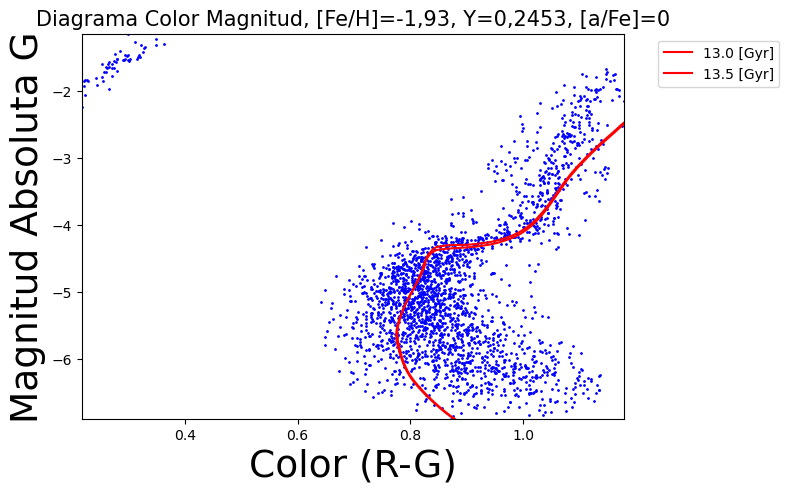

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.7637852474242447
la desviación RMS es:  0.7553418610745362


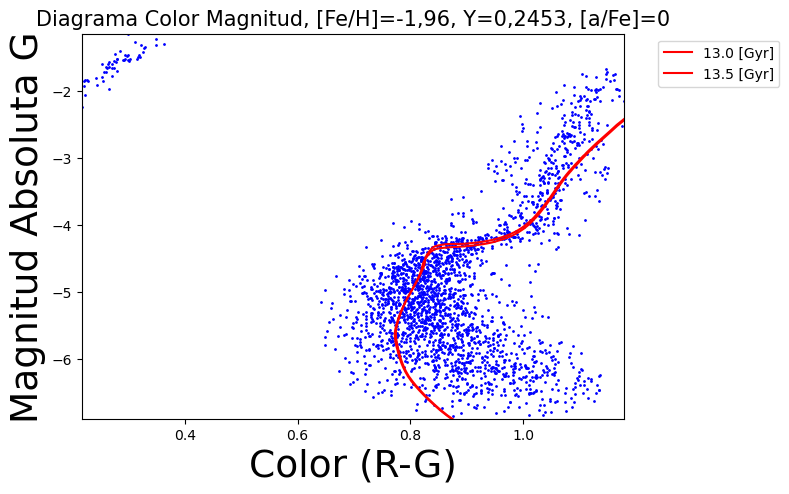

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.716808057548168
la desviación RMS es:  0.7240111748091608


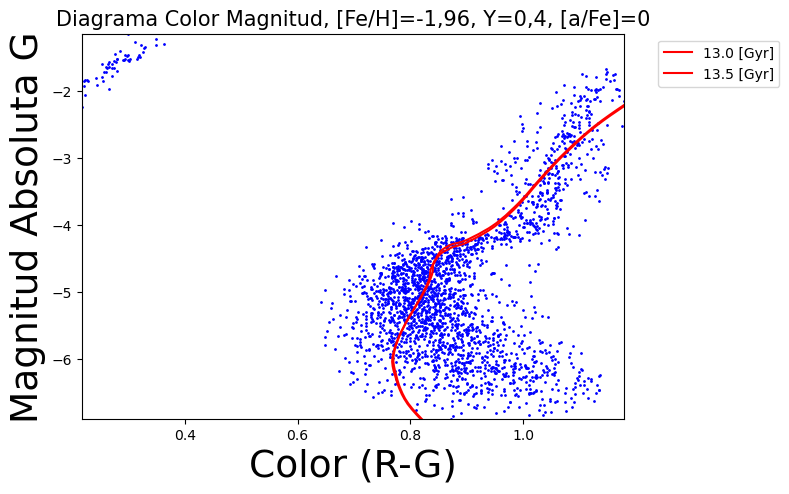

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.7390142648492751
la desviación RMS es:  0.7466693634927758


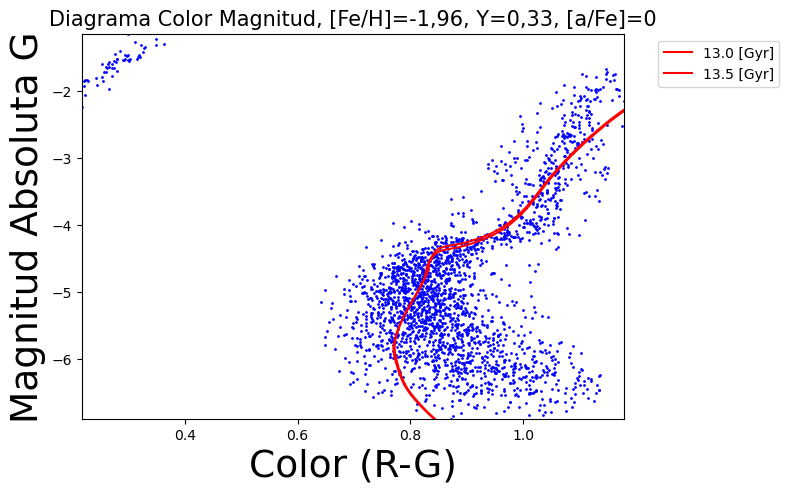

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.7205522411056359
la desviación RMS es:  0.7280456364636433


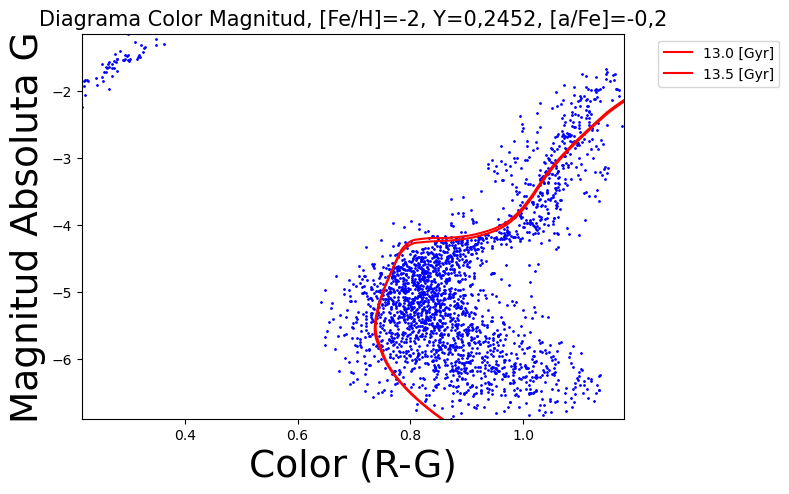

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.7000413622068701
la desviación RMS es:  0.6890552806069398


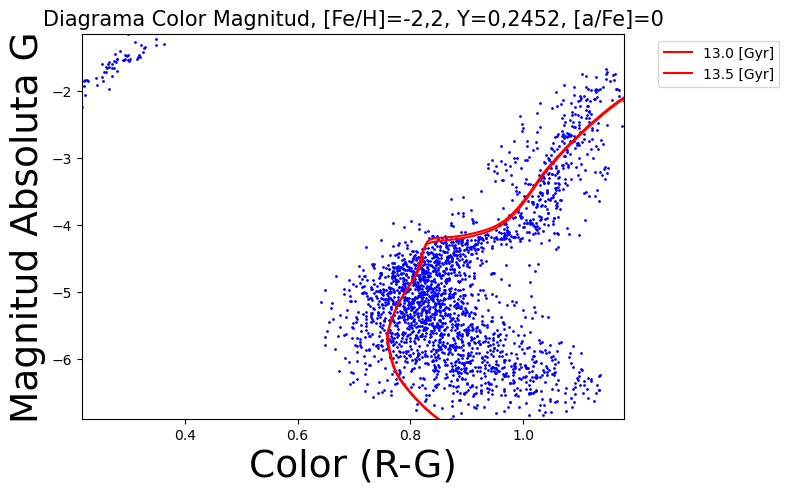

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.7503879863797116
la desviación RMS es:  0.7416106926098314


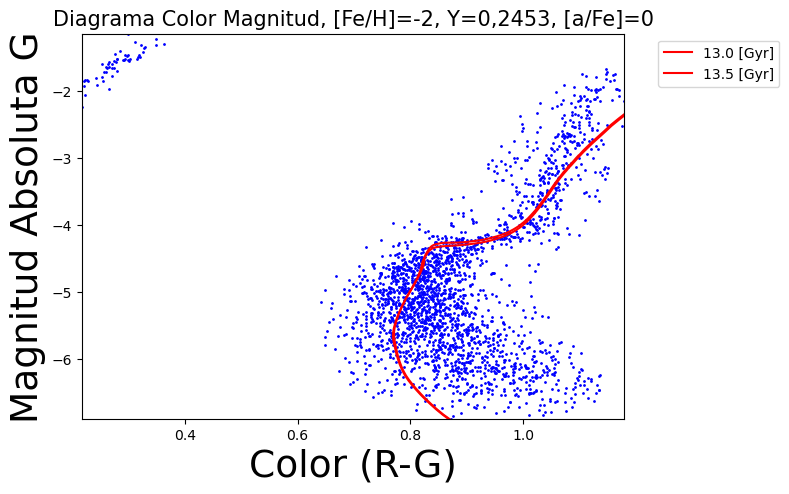

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.7733925139422692
la desviación RMS es:  0.7830835364765782


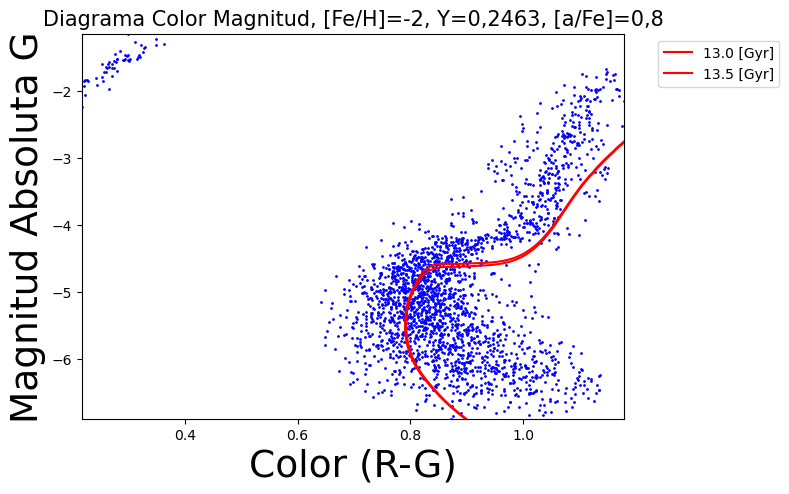

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.7340017440822755
la desviación RMS es:  0.7412719168315972


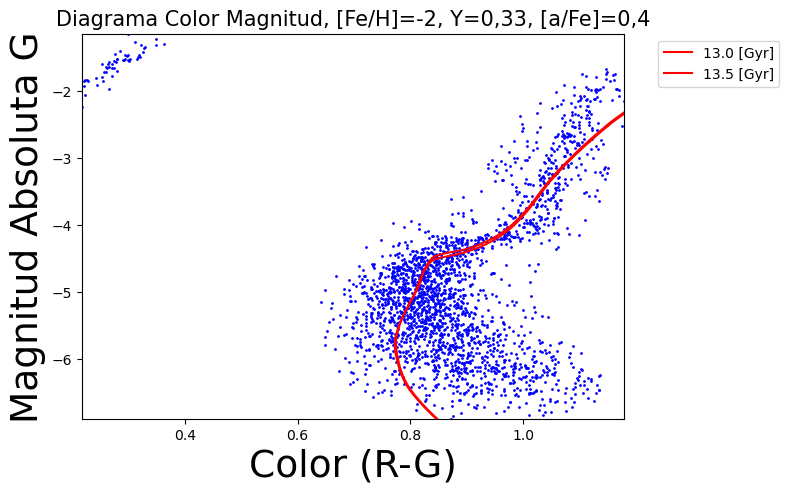

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  12.557945927903711
la desviación RMS es:  12.638348829293452


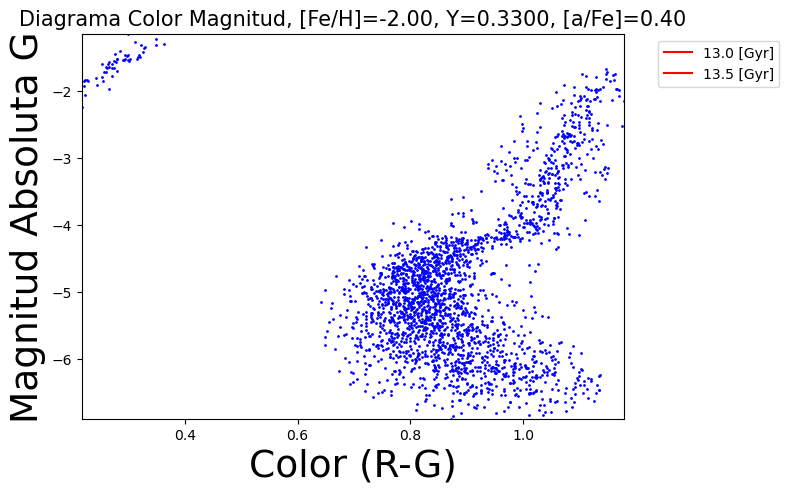

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  12.411358651737423
la desviación RMS es:  12.496955153071712


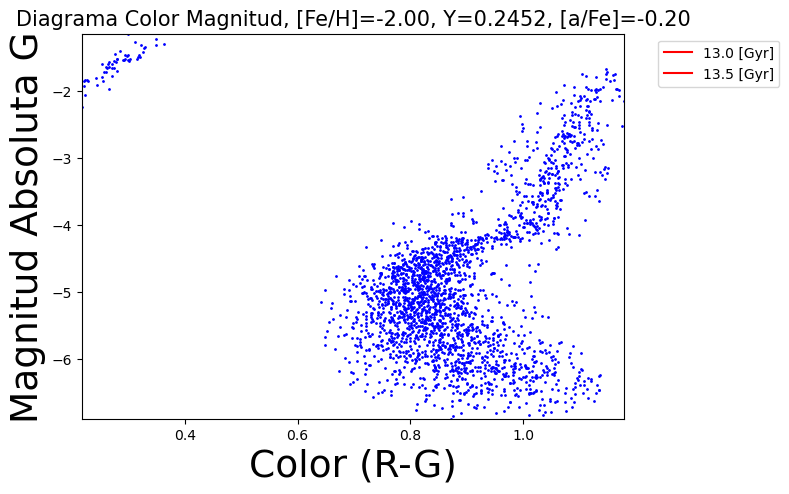

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.7340017440822755
la desviación RMS es:  0.7412719168315972


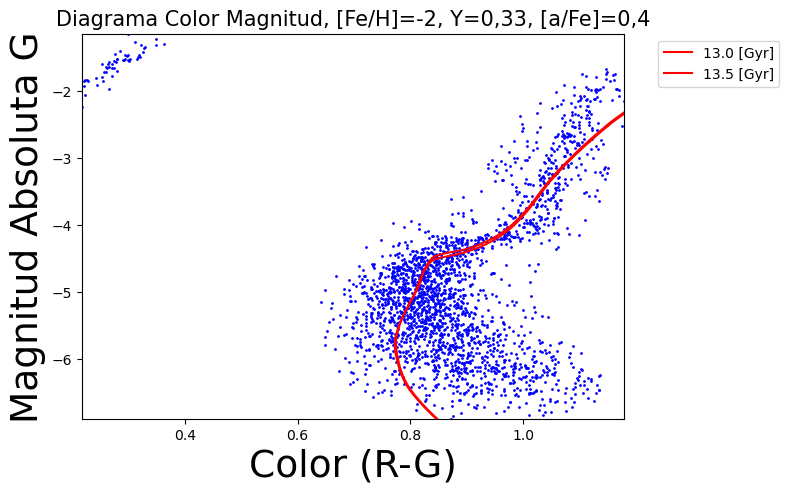

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.7205522411056359
la desviación RMS es:  0.7280456364636433


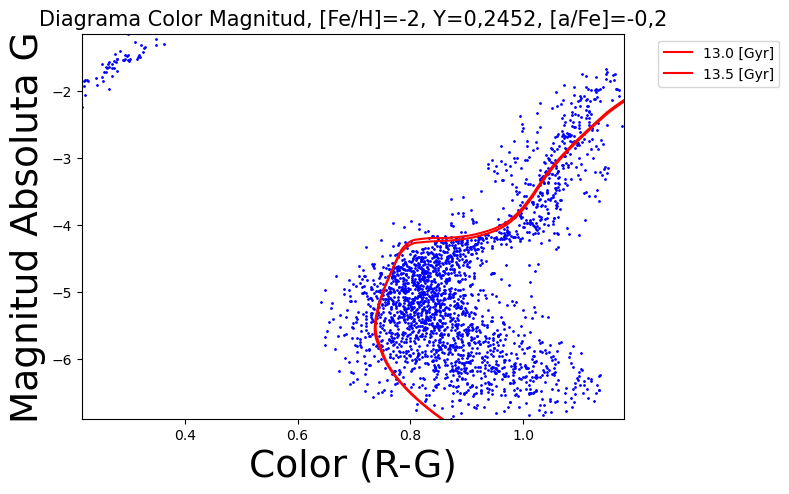

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.7503879863797116
la desviación RMS es:  0.7416106926098314


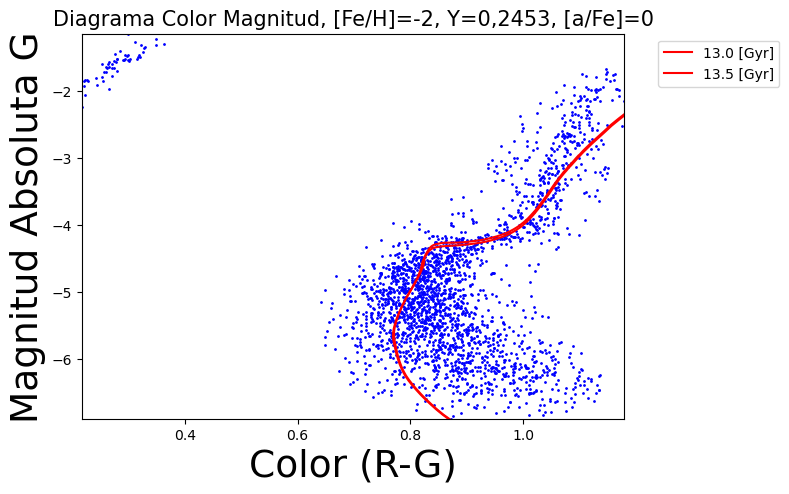

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.8824346734742471
la desviación RMS es:  0.876381977580823


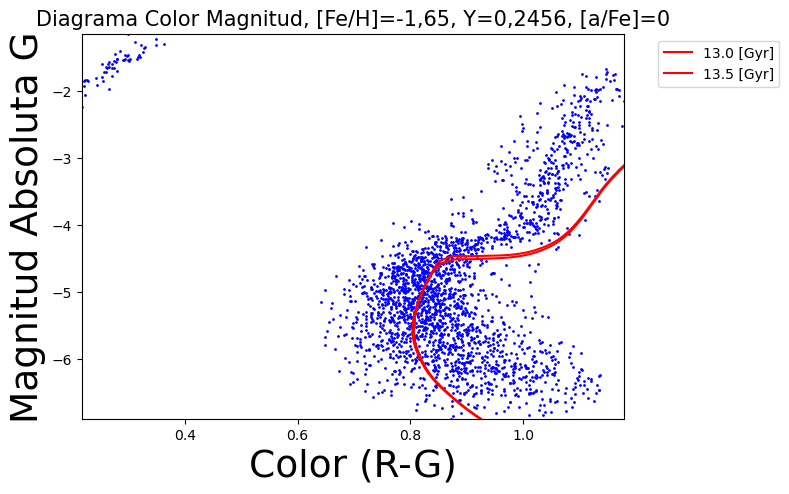

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.6512661129742328
la desviación RMS es:  0.6378695970701228


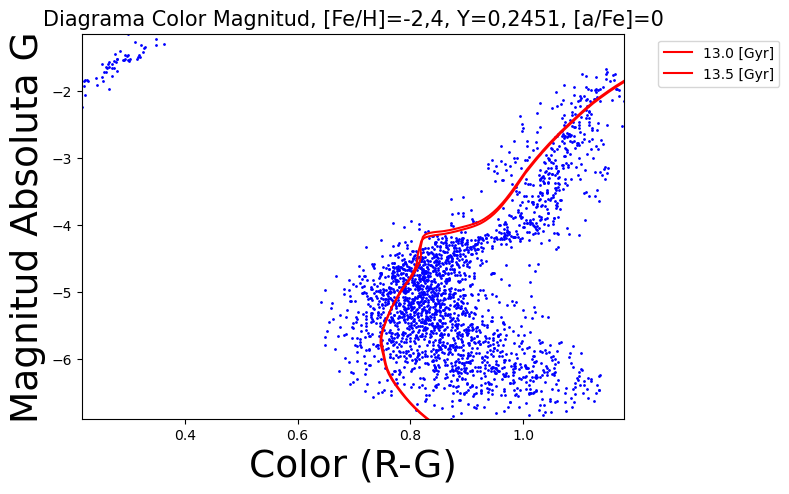

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.7970768863514199
la desviación RMS es:  0.8069243470881163


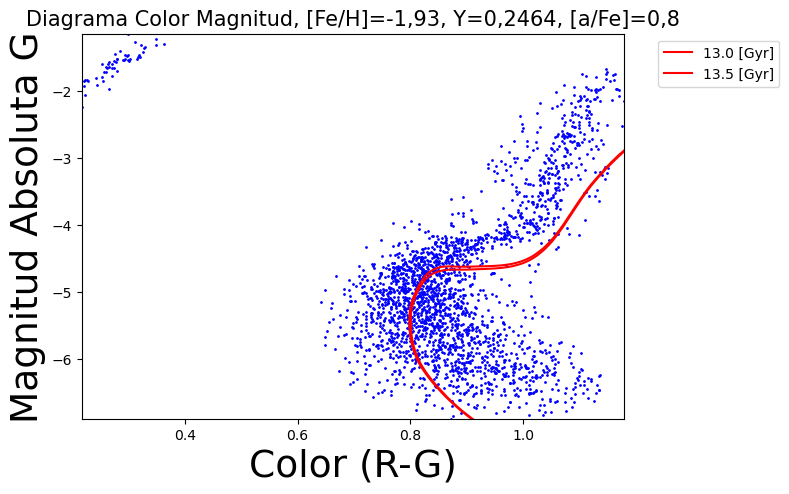

SDSS
la cantidad de estrellas del cúmulo, es aproximadamente  2371
la desviación RMS es:  0.7358488949077316
la desviación RMS es:  0.7435263577729856


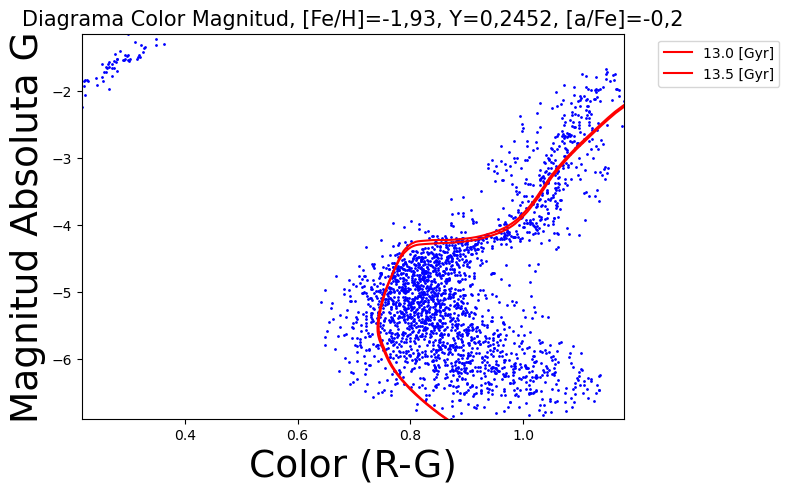

In [19]:
CMD_isocrona_SSDS_REDUCCION(Arreglo,32, 34)

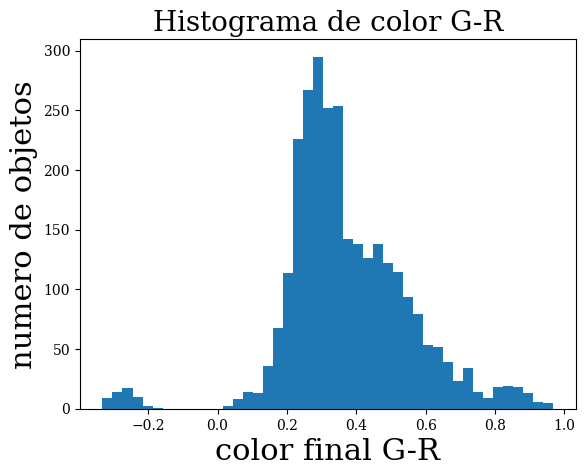

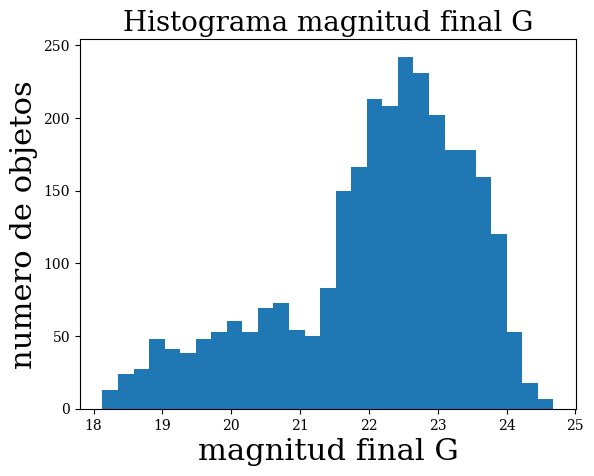

Radio core =  23.704 , Radio tidal =  47.567 , k =  6.533 , Radio Jacobi =  50.228
69
Los tres mínimos del ajuste por regresión lineal de la parábola de la pendiente son:  -2.63, -2.629, -2.627


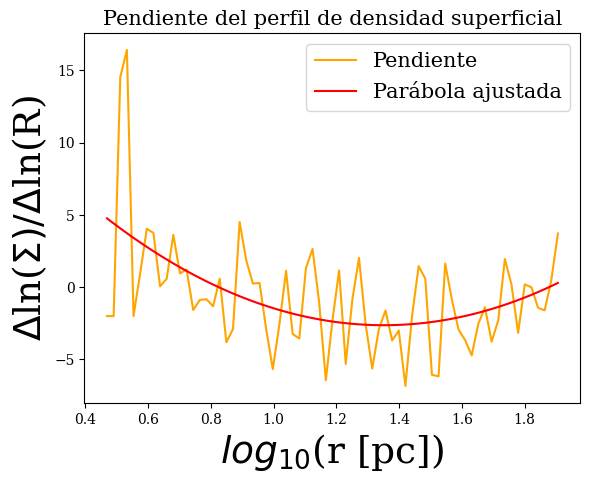

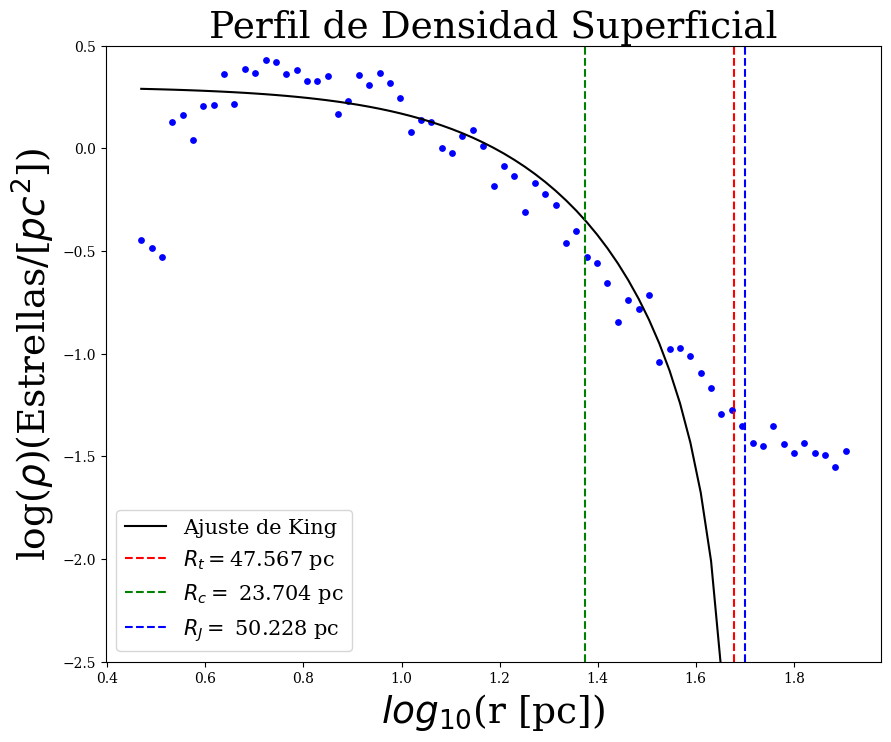

In [25]:
#Ahora hacemos el perfil de densidad radial
from scipy.optimize import least_squares
import numpy as np
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

def Perfil_Densidad_Superficial(RADIUS,f):
    # Creamos los bins para la distancia radial 
    #esta parte la queremos cambiar :bins = np.linspace(np.min(RADIUS), np.max(RADIUS), num=100)
    bins = np.geomspace(np.min(RADIUS), np.max(RADIUS), num=70)
    # Calculamos el número de estrellas por cada bin
    hist, bin_edges = np.histogram(RADIUS, bins=bins)
    surface_density = hist / (np.pi * (bin_edges[1:]**2 - bin_edges[:-1]**2))
    r, sdp = bin_edges[:-1], surface_density
    r = np.where(r==0, 1e-10, r)
    resultx = np.log10(r)
    sdp = np.where(sdp==0, 1e-10, sdp)
    resulty = np.log10(sdp)
      
    #de Kuzma et al. (2016) conseguimos el sgte perfil de King,
    #donde r_t, r_c y k son: radio tidal, radio del core y una 
    #constante proporcional a la densidad superficial central
    def king_density_profile(array, r_c, r_t, k):
        x = (array/r_c)**2 
        y = (r_t/r_c)**2
        return k*((1/np.sqrt(1 + x)) - (1/np.sqrt(1+y)))**2
    #Ajustamos el perfil de king a los datos
    adivinanza = np.array([-15.05, 49.47, 4.66])
    popt, pcov = curve_fit(king_density_profile, r[1:], sdp[1:], adivinanza)
    print("Radio core = ",round(abs(popt[0]),3),", Radio tidal = ",
          round(popt[1],3),", k = ",round(popt[2],3), ", Radio Jacobi = ", 
          round(RADIO_JAC5694,3))

    rc = popt[0]
    XX1 = resultx[tuple([r>-rc]&np.array([r<RADIO_JAC5694]))]    
    YY1 = resulty[tuple([r>-rc]&np.array([r<RADIO_JAC5694]))]   
    XX = (resultx[tuple([r<-rc])])[20:40]
    YY = (resulty[tuple([r<-rc])])[20:40]
    def funcion(r, A, c):
        return A + r**c
    p1, v1 = curve_fit(funcion, XX, YY)
    p, v = curve_fit(funcion, XX1, YY1)  
    
    z = 1
    b = int((len(resultx))/z)
    print(b)
    r_promedio = []
    dens_promedio = []
    for i in range(0, b):
    #Ahora lo que queremos hacer es mantener el mismo elemento pero añadido
    #unas z veces, lo que equivale a 
        for j in range(z):
            dens_promedio += [np.mean(resulty[i:i+z])]
            r_promedio += [np.mean(resultx[i:i+z])]
    dens_promedio = np.array(dens_promedio)
    r_promedio = np.array(r_promedio)
    pendiente = np.gradient(dens_promedio, r_promedio)
    #ahora me interesa obtener los mínimos:

    
    
    
    
    
        
    grado = 2  # Grado de la parábola
    poly_features = PolynomialFeatures(degree=grado)
    x_poly = poly_features.fit_transform(r_promedio.reshape(-1, 1))

    # Crear un modelo de regresión lineal
    model = LinearRegression()

    # Ajustar la parábola a los datos
    model.fit(x_poly, pendiente)

    # Obtener los coeficientes del modelo
    coeficientes = model.coef_
    intercepto = model.intercept_

    # Generar puntos para graficar la parábola ajustada
    x_plot = np.linspace(np.min(r_promedio), np.max(r_promedio), 100)
    x_plot_poly = poly_features.transform(x_plot.reshape(-1, 1))
    y_plot = model.predict(x_plot_poly)
 
    arreglo_ordenado = sorted(y_plot)
    tres_minimos = arreglo_ordenado[:3]
    print('Los tres mínimos del ajuste por regresión lineal de la parábola de la pendiente son: ', 
          str(round(tres_minimos[0],3))+', '+ str(round(tres_minimos[1],3)) +', '+ str(round(tres_minimos[2],3)))
    
    #ahora lo que queremos hacer es graficar la pendiente de la curva de densidad superficial
    #en funcion de log r, es decir, graficaremos "pendiente" vs r_promedio
    plt.plot(r_promedio, pendiente, '-', color = 'orange', label='Pendiente')
    plt.plot(x_plot, y_plot, color='red', label='Parábola ajustada')
    plt.xlabel('$log_{10}$(r ['+f+'])', fontsize=27)
    plt.ylabel(r'$\Delta$ln(' r'$\Sigma)$''/' r'$\Delta$''ln(R)', fontsize=27)
    plt.title('Pendiente del perfil de densidad superficial', fontsize=15)
    plt.legend(prop={'size': 15}, frameon=True)
    plt.show() 
    
    
    
    
    
    
    

    plt.figure(figsize=(10,8))
    plt.rc('font', family='serif')
    plt.scatter(resultx, resulty, s=15, color='blue');
    #perfil de king:
    plt.plot(resultx[r<=popt[1]], 
             np.log10(king_density_profile(r[r<=popt[1]],popt[0], popt[1], popt[2])),
             '-', color='black', label='Ajuste de King');
    plt.axvline(x=np.log10(popt[1]), color='red', linestyle='--', label='$R_{t} =$'+str(round(popt[1],3))+' pc')
    plt.axvline(x=np.log10(abs(popt[0])), color='green', linestyle='--', label='$R_{c} =$ '+str(round(abs(popt[0]),3))+' pc')
    plt.axvline(x=np.log10(RADIO_JAC5694), color='blue', linestyle='--', label='$R_{J} =$ '+str(round(RADIO_JAC5694,3))+' pc')         
          
    plt.xlabel('$log_{10}$(r ['+f+'])', fontsize=27)
    plt.ylabel('log(' r'$\rho$'')' '(Estrellas/[' r'$'+f+'^2$''])', fontsize=27)
    plt.title('Perfil de Densidad Superficial', fontsize=27)
    #lt.xlim(0.5,max(resultx[1:]))
    plt.ylim(-2.5,.5)
    plt.legend(prop={'size': 15}, frameon=True)

    plt.show() 


#RA DEC Y RADIO estan en grados, horas y arcominutos, respectivamente.
#queremos pasar los primeros a grados. Graficamos, como en Peñarrubia et
#al (2015), el perfil de densidad, con el radio en parsecs.

d = 29100 #parsecs
radius = RADIO*np.pi/(60*180) #Está en radianes
Radio_pc = d * radius #está en parsecs
#queremos calcular el rho_0, que es la densidad central del cúmulo globular
arr0 = np.array([(MAG_G-MAG_R)<1])#esto supuestamente quita las estrellas que están en la field dwarfs, en una primera aproxi
#mación xd.

#en este punto nos damos cuenta de que es necesario quitar todo excepto
#las estrellas de la isocrona y de la horizontal branch. i.e., necesita
#mos definir algún criterio que nos permita encerrar esta isocrona, aunque
#en realidad es un poco independiente de ella.
# Crear una función de densidad kernel a partir de los puntos en el gráfico

arr0 = [(MAG_G-MAG_R)<1]
arr1 = [CHI < chi_critico]
arr2 = np.array([a < b for a, b in zip(SHARP, POLINOMIO_SUP)])
arr3 = np.array([a > b for a, b in zip(SHARP, POLINOMIO_INF)])
arr4 = [RADIO>0] 
arr5 = [RADIO<10]
arr6 = arr1 & arr2 & arr3 & arr0 
arr8 = arr1 & arr2 & arr3 & arr0  & arr4 & arr5 
arr7 = arr6.tolist()
arr9 = arr8.tolist()

################################################################################################################################
xx=(MAG_G-MAG_R)[tuple(arr9)]
yy= (-MAG_G)[tuple(arr9)]
kde = gaussian_kde(np.vstack([x,y]))
positions = np.vstack([xx, yy])
kde = gaussian_kde(positions)
density = kde(positions)

# Crear una máscara para seleccionar los puntos dentro de la "isocrona"
dens1 = 0.1
mask = density >= density.max()*dens1
x_points = xx[mask]
y_points = yy[mask]


# Crear una máscara para datos de la rama horizontal
p_max = 0.1
p_min = 0.03
mask1 = density >= density.max()*p_min
mask2 = np.array(density < density.max()*p_max)
x_points1 = xx[mask1&mask2]
y_points1 = yy[mask1&mask2]


################################################################################################################################

#_pc_sin_sust =(Radio_pc[tuple(arr7)])[mask]
def concatenar(f):                  
    f = f[tuple(arr9)]
    HB_sust = (f)[mask1&mask2]       
    isocrona_sust = (f)[mask]                     
    return np.concatenate([HB_sust, isocrona_sust])                  
R_pc_con_sust = concatenar(Radio_pc)
MagnitudG= concatenar(MAG_G)
DEC_SUS = concatenar(DEC)
RA_SUS = concatenar(RA)

color_final = concatenar(MAG_G-MAG_R)
g_final = concatenar(MAG_G)
hist1, bins1 = np.histogram(color_final, bins='auto')
plt.hist(color_final, bins='auto')
plt.ylabel('numero de objetos', fontsize=22)
plt.xlabel('color final G-R', fontsize=22)
plt.title('Histograma de color G-R', fontsize=20)
plt.show()

hist2, bins2 = np.histogram(g_final, bins='auto')
plt.hist(g_final, bins='auto')
plt.ylabel('numero de objetos', fontsize=22)
plt.xlabel('magnitud final G', fontsize=22)
plt.title('Histograma magnitud final G', fontsize=20)
plt.show()



 
R_FINAL_arcmin = RADIO[tuple(arr7)]
Perfil_Densidad_Superficial(R_pc_con_sust,'pc')
#Perfil_Densidad_Superficial(R_pc_sin_sust,'pc')

#podemos graficar lo mismo, como en Kuzma et al (2017), en donde se usa 
#el radio pero en arcominutos. Parece ser que es más útil usar arcominutos 
#que usar parsecs, debido a que no conocemos la distancia a las estrellas
#circundantes del cluster, pero sí la del cluster.
#Perfil_Densidad_Superficial(R_FINAL_arcmin,'arcmin')

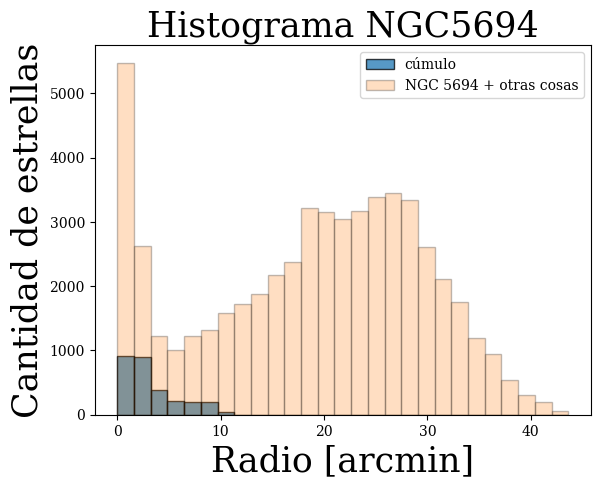

In [21]:
import matplotlib.pyplot as plt
import numpy as np

d=29100
radio_final_arcmin = R_pc_con_sust*((60*180)/(np.pi*d))

from scipy.stats import norm

# Datos de ejemplo
R_sin = radio_final_arcmin
R_con = RADIO

# Configuración del histograma
bin_edges = np.linspace(0, max(R_con), 28)  # Definir bordes de los contenedores

# Graficar los histogramas
plt.hist(R_sin, bins=bin_edges, edgecolor='black', alpha=0.75, label='cúmulo')
plt.hist(R_con, bins=bin_edges, edgecolor='black', alpha=0.25, label='NGC 5694 + otras cosas')


# Configuración de etiquetas y título
plt.xlabel('Radio [arcmin]', fontsize=25)
plt.ylabel('Cantidad de estrellas', fontsize=25)
plt.title('Histograma NGC5694', fontsize=25)

# Agregar una leyenda
plt.legend()

# Mostrar el gráfico
plt.show()


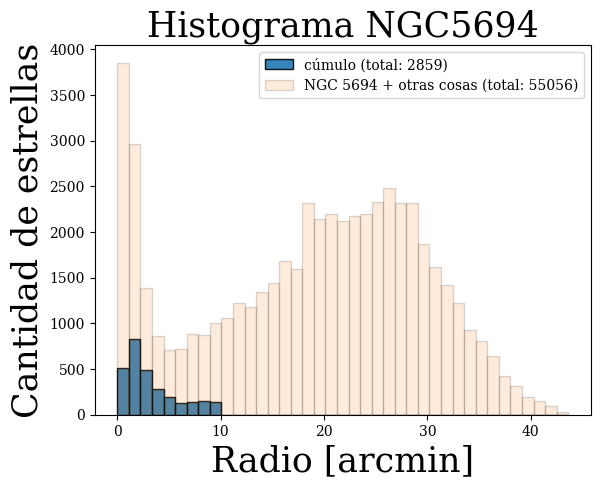

In [29]:
import matplotlib.pyplot as plt
import numpy as np

d = 29100
radio_final_arcmin = R_pc_con_sust * ((60 * 180) / (np.pi * d))

from scipy.stats import norm

# Datos de ejemplo
R_sin = radio_final_arcmin
R_con = RADIO

# Configuración del histograma
bin_edges = np.linspace(0, max(R_con), 40)  # Definir bordes de los contenedores

# Calcular los histogramas
hist_sin, _ = np.histogram(R_sin, bins=bin_edges)
hist_con, _ = np.histogram(R_con, bins=bin_edges)

# Suma de los conteos de cada histograma
suma_sin = np.sum(hist_sin)
suma_con = np.sum(hist_con)

# Graficar los histogramas
plt.hist(R_sin, bins=bin_edges, edgecolor='black', alpha=0.9, label='cúmulo (total: ' + str(suma_sin) + ')')
plt.hist(R_con, bins=bin_edges, edgecolor='black', alpha=0.15, label='NGC 5694 + otras cosas (total: ' + str(suma_con) + ')')

# Configuración de etiquetas y título
plt.xlabel('Radio [arcmin]', fontsize=25)
plt.ylabel('Cantidad de estrellas', fontsize=25)
plt.title('Histograma NGC5694', fontsize=25)

# Agregar una leyenda
plt.legend()

# Mostrar el gráfico
plt.show()



2370 2370


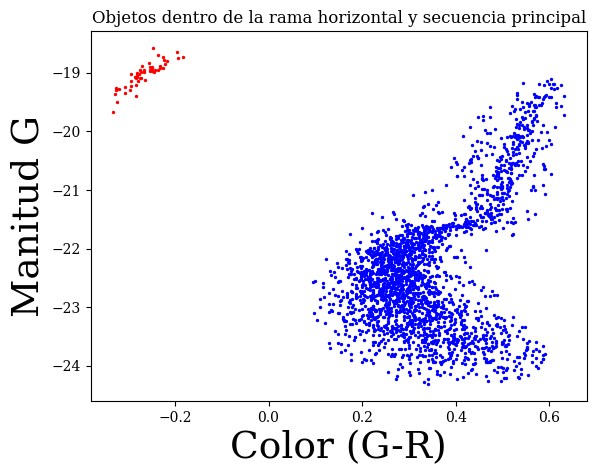

In [22]:
#unimos todos los puntos
color_cumulo = np.concatenate([x_points1[x_points1<-0.1], x_points])
magnitud_cumulo = np.concatenate([y_points1[x_points1<-0.1], y_points])
print(len(color_cumulo), len(magnitud_cumulo))

#plt.scatter(color_cumulo, magnitud_cumulo, s=0.1)
plt.scatter(x_points, y_points, s=2, color='blue')
plt.scatter(x_points1[x_points1<0], y_points1[x_points1<0], s=2,color='red')
plt.title('Objetos dentro de la rama horizontal y secuencia principal')
plt.ylabel('Manitud G',fontsize=27)
plt.xlabel('Color (G-R)',fontsize=27)

plt.show()

#QUEREMOS VER COMO SE VE el radio:
#fig = plt.figure(figsize=(7,5))
#ax = fig.add_subplot(111)
#plt.scatter(DEC_SUS, RA_SUS, s=0.1)
#esencialmente, queremos calcular la densidad promedio de los 8 cuadros de la figura, que
#no son parte del cúmulo, para luego restarselos al perfil de densidad.
#plt.axvline(x=min(DEC_SUS), ymin=0, ymax=400, color='red')
#plt.axvline(x=max(DEC_SUS), ymin=0, ymax=400, color='red')
#plt.axhline(y=min(RA_SUS), xmin=0, xmax=400, color='red')
#plt.axhline(y=max(RA_SUS), xmin=0, xmax=400, color='red')


#plt.axvline(x=min(DEC), ymin=0, ymax=400, color='red')
#plt.axvline(x=max(DEC), ymin=0, ymax=400, color='red')
#plt.axhline(y=min(RA), xmin=0, xmax=400, color='red')
#plt.axhline(y=max(RA), xmin=0, xmax=400, color='red')
#plt.show()


#plt.show()